In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
#!unzip /content/gdrive/MyDrive/IMP/embedded_data-20210323T034408Z-001.zip -d /content/gdrive/MyDrive/IMP/e

In [3]:
import json
import numpy as np

In [4]:
import tensorflow as tf
tf.config.run_functions_eagerly(True)

In [5]:
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Concatenate,LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

In [6]:
#filetry = '/content/gdrive/MyDrive/embedded_data/emd_im_name_feature.json'
#with open(filetry) as train_file1:
#    emd_im_name_feature = json.load(train_file1)
#for k,v in emd_im_name_feature.items():
#  print(k)
#  print((np.array(v)).shape)

In [7]:
import pickle


with open('/content/gdrive/MyDrive/btp_data/roi_dic_400.pkl', 'rb') as f:
    roi_dic_400 = pickle.load(f)
with open('/content/gdrive/MyDrive/btp_data/roi_dic_800.pkl', 'rb') as f:
    roi_dic_800 = pickle.load(f)
with open('/content/gdrive/MyDrive/btp_data/roi_dic_1200.pkl', 'rb') as f:
    roi_dic_1200 = pickle.load(f)
with open('/content/gdrive/MyDrive/btp_data/roi_dic_1609.pkl', 'rb') as f:
    roi_dic_1609 = pickle.load(f)

emd_im_name_feature={}

for k,v in roi_dic_400.items():
  emd_im_name_feature[k]=v
for k,v in roi_dic_800.items():
  emd_im_name_feature[k]=v
for k,v in roi_dic_1200.items():
  emd_im_name_feature[k]=v
for k,v in roi_dic_1609.items():
  emd_im_name_feature[k]=v
print(len(emd_im_name_feature))

1609


In [8]:
filetry = '/content/gdrive/MyDrive/embedded_data/emd_im_name_article_list_tokenized.json'
with open(filetry) as train_file1:
    emd_im_name_article_list_tokenized = json.load(train_file1)
#for k,v in emd_im_name_article_list_tokenized.items():
#  print(k)
#  print((np.array(v)).shape)

In [9]:
filetry = '/content/gdrive/MyDrive/embedded_data/emd_im_name_caption_tokenized.json'
with open(filetry) as train_file1:
    emd_im_name_caption_tokenized = json.load(train_file1)
#for k,v in emd_im_name_caption_tokenized.items():
#  print(k)
#  print((np.array(v)).shape)

In [10]:
all_data=[]
for k,v in emd_im_name_feature.items():
  all_data.append(k)

In [11]:
array=[]
for i in range(1500):
  array.append(np.array(emd_im_name_article_list_tokenized[all_data[i]]))
X_article_train=np.stack(array, axis=0)
print(X_article_train.shape)

(1500, 40, 1024)


In [12]:
array=[]
for i in range(1500):
  npp=np.array(emd_im_name_caption_tokenized[all_data[i]])
  npp=npp.flatten()
  array.append(npp)
Y_caption_train=np.stack(array, axis=0)
print(Y_caption_train.shape)

(1500, 1024)


In [13]:
array=[]
for i in range(1500):
  npp=np.array(emd_im_name_feature[all_data[i]])
  npp=npp.flatten()
  array.append(npp)

X_image_train=np.stack(array, axis=0)
print(X_image_train.shape)

(1500, 75264)


In [14]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [15]:
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

In [16]:
class PositionEmbedding(layers.Layer):
    def __init__(self, maxlen, embed_dim):
        super(PositionEmbedding, self).__init__()
        self.pos_emb = layers.Embedding(input_dim=maxlen, output_dim=embed_dim)

    def call(self, x):
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        return x + positions

In [17]:
maxlen = 40  
embed_dim = 2048  # Embedding size for each token
num_heads = 2  # Number of attention heads
ff_dim = 32  # Hidden layer size in feed forward network inside transformer

In [18]:
#inputs = layers.Input(shape=(maxlen,))
#embedding_layer = TokenAndPositionEmbedding(maxlen, vocab_size, embed_dim)
#x = embedding_layer(inputs)
#transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
#x = transformer_block(x)
#x = layers.GlobalAveragePooling1D()(x)
#x = layers.Dropout(0.1)(x)
#x = layers.Dense(20, activation="relu")(x)
#x = layers.Dropout(0.1)(x)
#outputs = layers.Dense(2, activation="softmax")(x)

#model = keras.Model(inputs=inputs, outputs=outputs)

Model

In [19]:
input1 = Input(shape=(40,1024)) #article
inp= Dropout(0.1)(input1)
ls_art = LSTM(1024)(inp)  #1024 article vector
input2 = Input(shape=(75264,)) #image
input22 = Dense(1024,activation='relu')(input2)
con_cat = Concatenate()([ls_art, input22])
re= Reshape((1, 2048), input_shape=(2048,))(con_cat)
re1= Dropout(0.2)(re) #2048 vector (article +image ) features
#first

embedding_layer = PositionEmbedding(maxlen, embed_dim)
re11 = embedding_layer(re1)

transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
ls =transformer_block(re11) #40*2048

flt=Flatten()(ls)
ls_2048 = Dense(2048,activation='relu')(flt)
re2= Reshape((1, 2048), input_shape=(2048,))(ls_2048)

#second

attn_out = tf.keras.layers.Attention()([re1,re2])
con2= Concatenate()([re2,attn_out])
ls_dense = Dense(1024,activation='relu')(con2)
ls1 = layers.GlobalAveragePooling1D()(ls_dense)
model = Model(inputs=[input1, input2], outputs=ls1)

In [20]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 40, 1024)]   0                                            
__________________________________________________________________________________________________
dropout (Dropout)               (None, 40, 1024)     0           input_1[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 75264)]      0                                            
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 1024)         8392704     dropout[0][0]                    
______________________________________________________________________________________________

In [21]:
opt = tf.keras.optimizers.SGD(learning_rate=0.1,momentum=0.7)

In [22]:
model.compile(loss='categorical_crossentropy', optimizer=opt)

In [23]:
model.fit(x=[X_article_train,X_image_train],y=Y_caption_train,epochs=20)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


Epoch 1/20
47/47 [==============================] - 34s 106ms/step - loss: 164.8339
Epoch 2/20
47/47 [==============================] - 5s 106ms/step - loss: 150.3540
Epoch 3/20
47/47 [==============================] - 5s 105ms/step - loss: 149.3660
Epoch 4/20
47/47 [==============================] - 5s 106ms/step - loss: 148.4098
Epoch 5/20
47/47 [==============================] - 5s 105ms/step - loss: 147.6020
Epoch 6/20
47/47 [==============================] - 5s 106ms/step - loss: 147.2575
Epoch 7/20
47/47 [==============================] - 5s 105ms/step - loss: 146.7255
Epoch 8/20
47/47 [==============================] - 5s 106ms/step - loss: 146.7063
Epoch 9/20
47/47 [==============================] - 5s 105ms/step - loss: 146.5458
Epoch 10/20
47/47 [==============================] - 5s 105ms/step - loss: 145.9003
Epoch 11/20
47/47 [==============================] - 5s 106ms/step - loss: 145.1026
Epoch 12/20
47/47 [==============================] - 5s 105ms/step - loss: 144.5372


Testing

In [24]:
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
from google.colab.patches import cv2_imshow

In [25]:
#!unzip /content/gdrive/MyDrive/IMP/btp_data-20210323T040838Z-001.zip -d /content/gdrive/MyDrive/IMP/b

In [26]:
filetry = '/content/gdrive/MyDrive/btp_data/im_name_article_list_1.json'
with open(filetry) as train_file1:
    article_list_real = json.load(train_file1)
filetry = '/content/gdrive/MyDrive/btp_data/im_name_caption.json'
with open(filetry) as train_file1:
    caption_real = json.load(train_file1)

In [27]:
filetry = '/content/gdrive/MyDrive/btp_data/im_name_capno_50_final.json'
with open(filetry) as train_file1:
    img_cap_real = json.load(train_file1)

In [28]:
array=[]
for i in range(1500,1609):
  array.append(np.array(emd_im_name_article_list_tokenized[all_data[i]]))
X_article_test=np.stack(array, axis=0)
print(X_article_test.shape)

(109, 40, 1024)


In [29]:
array=[]
for i in range(1500,1609):
  npp=np.array(emd_im_name_feature[all_data[i]])
  npp=npp.flatten()
  array.append(npp)

X_image_test=np.stack(array, axis=0)
print(X_image_test.shape)

(109, 75264)


In [30]:
output=model.predict([X_article_test,X_image_test])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


In [31]:
!pip install -U spacy
!python -m spacy download en_core_web_sm
import spacy
nlp = spacy.load("en_core_web_sm")

     |████████████████████████████████| 12.8MB 243kB/s 
     |████████████████████████████████| 9.1MB 50.5MB/s 
     |████████████████████████████████| 1.1MB 50.4MB/s 
     |████████████████████████████████| 51kB 9.0MB/s 
     |████████████████████████████████| 460kB 51.6MB/s 
     |████████████████████████████████| 122kB 59.9MB/s 
  Created wheel for smart-open: filename=smart_open-3.0.0-cp37-none-any.whl size=107098 sha256=f99259be47cca62011260455b6b02489e42d7ea6c663da74e7ef94778cc89113
  Stored in directory: /root/.cache/pip/wheels/18/88/7c/f06dabd5e9cabe02d2269167bcacbbf9b47d0c0ff7d6ebcb78
Successfully built smart-open
  Found existing installation: catalogue 1.0.0
    Uninstalling catalogue-1.0.0:
      Successfully uninstalled catalogue-1.0.0
  Found existing installation: srsly 1.0.5
    Uninstalling srsly-1.0.5:
      Successfully uninstalled srsly-1.0.5
  Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Found e

In [32]:
import cv2

from nltk.translate.bleu_score import sentence_bleu


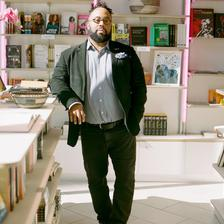

None
Caption:
The format is out of step with contemporary nonfiction, much of which divides into memoirs certified by their authors' griefs and endurances (a subject on which Young has a few things to say), or tidy journalistic forays reflecting the one-chapter-and-outline format of a successful book proposal, in which the author's thesis is delivered by the end of 40 pages, then padded with anecdotes and examples.
True val
Kevin Young at the Schomburg Center for Research in Black Culture.



['Kevin', 'Young', 'at', 'the', 'Schomburg', 'Center', 'for', 'Research', 'in', 'Black', 'Culture.']
['The', 'format', 'is', 'out', 'of', 'step', 'with', 'contemporary', 'nonfiction,', 'much', 'of', 'which', 'divides', 'into', 'memoirs', 'certified', 'by', 'their', "authors'", 'griefs', 'and', 'endurances', '(a', 'subject', 'on', 'which', 'Young', 'has', 'a', 'few', 'things', 'to', 'say),', 'or', 'tidy', 'journalistic', 'forays', 'reflecting', 'the', 'one-chapter-and-outline', 'format', 'of', 'a',

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


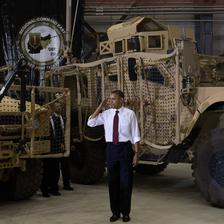

None
Caption:
Of course, the innovations of drone warfare make it easier for a president to be tough at little cost to Americans, or to his political standing.
True val

President Obama saluting members of the military on Tuesday at Bagram Air Force Base during his visit to Afghanistan.





['President', 'Obama', 'saluting', 'members', 'of', 'the', 'military', 'on', 'Tuesday', 'at', 'Bagram', 'Air', 'Force', 'Base', 'during', 'his', 'visit', 'to', 'Afghanistan.']
['Of', 'course,', 'the', 'innovations', 'of', 'drone', 'warfare', 'make', 'it', 'easier', 'for', 'a', 'president', 'to', 'be', 'tough', 'at', 'little', 'cost', 'to', 'Americans,', 'or', 'to', 'his', 'political', 'standing.']
0.4428500142691474
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


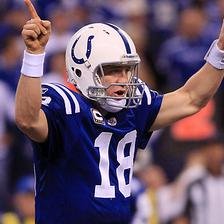

None
Caption:
Anticipating a Jets blitz, the Colts used maximum protection and when Manning hit the rookie receiver Austin Collie on a 46-yard deep seam route, they knew.
True val

Peyton Manning has lost only once to a Rex Ryan-led defense — when he played little more than a half last month.





['Peyton', 'Manning', 'has', 'lost', 'only', 'once', 'to', 'a', 'Rex', 'Ryan-led', 'defense', '—', 'when', 'he', 'played', 'little', 'more', 'than', 'a', 'half', 'last', 'month.']
['Anticipating', 'a', 'Jets', 'blitz,', 'the', 'Colts', 'used', 'maximum', 'protection', 'and', 'when', 'Manning', 'hit', 'the', 'rookie', 'receiver', 'Austin', 'Collie', 'on', 'a', '46-yard', 'deep', 'seam', 'route,', 'they', 'knew.']
0.4428500142691474
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


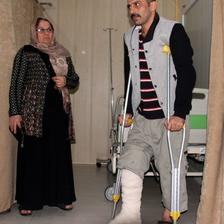

None
Caption:
TEHRAN -- An earthquake struck the border region of Iran and Iraq on Sunday, killing over 100 people in Iran, the country's National Medical Emergency Service reported, according to the state English-language television news channel, Press TV.
True val
An earthquake victim at a hospital in Sulaimaniyah, Iraq, on Sunday.



['An', 'earthquake', 'victim', 'at', 'a', 'hospital', 'in', 'Sulaimaniyah,', 'Iraq,', 'on', 'Sunday.']
['TEHRAN', '--', 'An', 'earthquake', 'struck', 'the', 'border', 'region', 'of', 'Iran', 'and', 'Iraq', 'on', 'Sunday,', 'killing', 'over', '100', 'people', 'in', 'Iran,', 'the', "country's", 'National', 'Medical', 'Emergency', 'Service', 'reported,', 'according', 'to', 'the', 'state', 'English-language', 'television', 'news', 'channel,', 'Press', 'TV.']
0
0.125


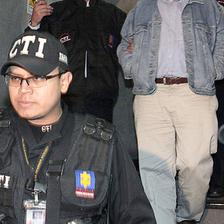

None
Caption:
The Colombian weekly newsmagazine Semana said that the allegations against Mr. Lopez had stunned "a country that thought it had seen everything when it came to irrational violence" and that if they were proved true, the development "would be one of the most bizarre in 50 years of armed conflict."
True val

Sigifredo López was detained Wednesday on suspicion of helping his kidnappers.





['Sigifredo', 'López', 'was', 'detained', 'Wednesday', 'on', 'suspicion', 'of', 'helping', 'his', 'kidnappers.']
['The', 'Colombian', 'weekly', 'newsmagazine', 'Semana', 'said', 'that', 'the', 'allegations', 'against', 'Mr.', 'Lopez', 'had', 'stunned', '"a', 'country', 'that', 'thought', 'it', 'had', 'seen', 'everything', 'when', 'it', 'came', 'to', 'irrational', 'violence"', 'and', 'that', 'if', 'they', 'were', 'proved', 'true,', 'the', 'development', '"would', 'be', 'one', 'of', 'the', 'most', 'bizarre', 'in', '50', 'years', 'of', 'armed', 'conflict."']
0
0.0


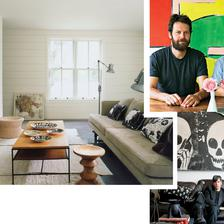

None
Caption:
Anyone who has ever renovated a house knows that construction invariably takes longer than expected.
True val

Open houses Clockwise from top left: the home of Tiina Laakkonen and Jon Rosen in Amagansett, N.Y.; Martino Gamper and Francis Upritchard in London; Bill Mullen in New York.





['Open', 'houses', 'Clockwise', 'from', 'top', 'left:', 'the', 'home', 'of', 'Tiina', 'Laakkonen', 'and', 'Jon', 'Rosen', 'in', 'Amagansett,', 'N.Y.;', 'Martino', 'Gamper', 'and', 'Francis', 'Upritchard', 'in', 'London;', 'Bill', 'Mullen', 'in', 'New', 'York.']
['Anyone', 'who', 'has', 'ever', 'renovated', 'a', 'house', 'knows', 'that', 'construction', 'invariably', 'takes', 'longer', 'than', 'expected.']
0.5081327481546147


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


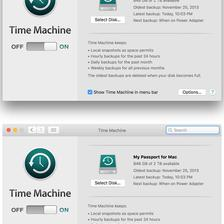

None
Caption:
If you press the Command, Shift and 4 keys and then press the space bar immediately, you can click the highlighted window to take a cropped screenshot of just that window.
True val
If you prefer your screenshots without the 3-D shadow effect, hold down the Option key when you click to capture the image.



['If', 'you', 'prefer', 'your', 'screenshots', 'without', 'the', '3-D', 'shadow', 'effect,', 'hold', 'down', 'the', 'Option', 'key', 'when', 'you', 'click', 'to', 'capture', 'the', 'image.']
['If', 'you', 'press', 'the', 'Command,', 'Shift', 'and', '4', 'keys', 'and', 'then', 'press', 'the', 'space', 'bar', 'immediately,', 'you', 'can', 'click', 'the', 'highlighted', 'window', 'to', 'take', 'a', 'cropped', 'screenshot', 'of', 'just', 'that', 'window.']
0.42379865741502165
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


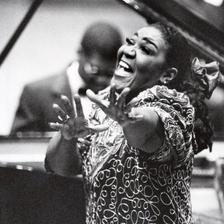

None
Caption:
Beginning in the late 1960s Ms. Smith sang with the pianist Big Tiny Little's band, and later with a sextet led by the trombonist Tyree Glenn.
True val

Carrie Smith performing at Avery Fisher Hall in 1992.





['Carrie', 'Smith', 'performing', 'at', 'Avery', 'Fisher', 'Hall', 'in', '1992.']
['Beginning', 'in', 'the', 'late', '1960s', 'Ms.', 'Smith', 'sang', 'with', 'the', 'pianist', 'Big', 'Tiny', "Little's", 'band,', 'and', 'later', 'with', 'a', 'sextet', 'led', 'by', 'the', 'trombonist', 'Tyree', 'Glenn.']
0.4428500142691474
0.3333333333333333


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


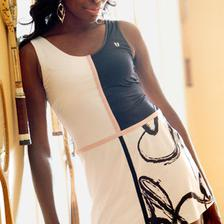

None
Caption:
I selected a Tibi denim-colored pantsuit that has a great short-sleeve jacket and a white cashmere tank top from Ralph Lauren underneath.
True val

Venus Williams.





['Venus', 'Williams.']
['I', 'selected', 'a', 'Tibi', 'denim-colored', 'pantsuit', 'that', 'has', 'a', 'great', 'short-sleeve', 'jacket', 'and', 'a', 'white', 'cashmere', 'tank', 'top', 'from', 'Ralph', 'Lauren', 'underneath.']
0.46173663094410267
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


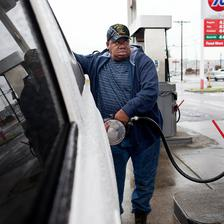

None
Caption:
"Things are a little, little bit better than they were," said Dennis Barker, a former construction worker who started a home-renovation business about a month ago with a friend.
True val

Tony Holloway filled his truck at a gas station in Tacoma, Wash. Mr. Holloway has limited himself to one trip to the store a week since gas prices have spiked in the area.





['Tony', 'Holloway', 'filled', 'his', 'truck', 'at', 'a', 'gas', 'station', 'in', 'Tacoma,', 'Wash.', 'Mr.', 'Holloway', 'has', 'limited', 'himself', 'to', 'one', 'trip', 'to', 'the', 'store', 'a', 'week', 'since', 'gas', 'prices', 'have', 'spiked', 'in', 'the', 'area.']
['"Things', 'are', 'a', 'little,', 'little', 'bit', 'better', 'than', 'they', 'were,"', 'said', 'Dennis', 'Barker,', 'a', 'former', 'construction', 'worker', 'who', 'started', 'a', 'home-renovation', 'business', 'about', 'a', 'month', 'ago', 'with', 'a', 'friend.']
0.5124576721246791
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


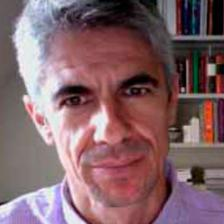

None
Caption:
Since he was in the country on a work visa sponsored by Princeton, he would have to find another job -- and sponsor -- quickly.
True val

Friends and colleagues say Antonio Calvo had been dismissed.





['Friends', 'and', 'colleagues', 'say', 'Antonio', 'Calvo', 'had', 'been', 'dismissed.']
['Since', 'he', 'was', 'in', 'the', 'country', 'on', 'a', 'work', 'visa', 'sponsored', 'by', 'Princeton,', 'he', 'would', 'have', 'to', 'find', 'another', 'job', '--', 'and', 'sponsor', '--', 'quickly.']
0.447213595499958
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


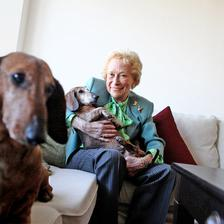

None
Caption:
And she has no intention of stopping, despite her age.
True val

Iris Love with her dachshunds, Euphrosyne and Diomedes.





['Iris', 'Love', 'with', 'her', 'dachshunds,', 'Euphrosyne', 'and', 'Diomedes.']
['And', 'she', 'has', 'no', 'intention', 'of', 'stopping,', 'despite', 'her', 'age.']
0


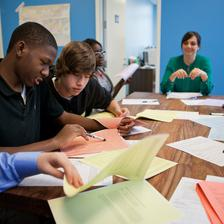

None
Caption:
Resist it."
True val

Freshmen at Léman Manhattan Preparatory School, a for-profit institution, reviewing sample college applications. Nonprofit schools are more likely to delay the college process to junior year.





['Freshmen', 'at', 'Léman', 'Manhattan', 'Preparatory', 'School,', 'a', 'for-profit', 'institution,', 'reviewing', 'sample', 'college', 'applications.', 'Nonprofit', 'schools', 'are', 'more', 'likely', 'to', 'delay', 'the', 'college', 'process', 'to', 'junior', 'year.']
['Resist', 'it."']
0


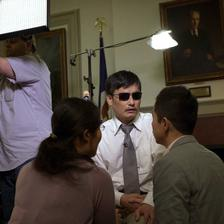

None
Caption:
Mr. Chen, in the interview with CNN, also voiced concern about the friends and dissidents who aided his escape in late April from a home that the police had turned into a virtual prison, circling it with guards, covering windows and keeping visitors out.
True val

Chen Guangcheng, the blind Chinese dissident, before an interview in New York on Thursday.





['Chen', 'Guangcheng,', 'the', 'blind', 'Chinese', 'dissident,', 'before', 'an', 'interview', 'in', 'New', 'York', 'on', 'Thursday.']
['Mr.', 'Chen,', 'in', 'the', 'interview', 'with', 'CNN,', 'also', 'voiced', 'concern', 'about', 'the', 'friends', 'and', 'dissidents', 'who', 'aided', 'his', 'escape', 'in', 'late', 'April', 'from', 'a', 'home', 'that', 'the', 'police', 'had', 'turned', 'into', 'a', 'virtual', 'prison,', 'circling', 'it', 'with', 'guards,', 'covering', 'windows', 'and', 'keeping', 'visitors', 'out.']
0.3882726777522233
0.5


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


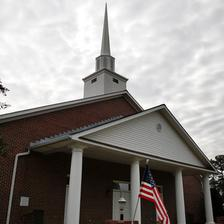

None
Caption:
What does this have to with Roy Moore, the Republican running for Senate in Alabama?
True val
Roy Moore is still supported by many at his home church, First Baptist Church in Gallant, Ala.



['Roy', 'Moore', 'is', 'still', 'supported', 'by', 'many', 'at', 'his', 'home', 'church,', 'First', 'Baptist', 'Church', 'in', 'Gallant,', 'Ala.']
['What', 'does', 'this', 'have', 'to', 'with', 'Roy', 'Moore,', 'the', 'Republican', 'running', 'for', 'Senate', 'in', 'Alabama?']
0
0.25


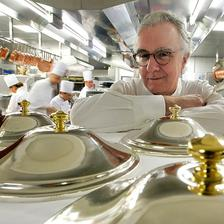

None
Caption:
Tickets for either class are $40 from 92Y.org; (212) 415-5500.
True val

The chef Alain Ducasse will receive an award on Friday.





['The', 'chef', 'Alain', 'Ducasse', 'will', 'receive', 'an', 'award', 'on', 'Friday.']
['Tickets', 'for', 'either', 'class', 'are', '$40', 'from', '92Y.org;', '(212)', '415-5500.']
0
0.0


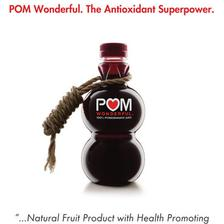

None
Caption:
Those aspects of the judge's ruling are not mentioned in Pom Wonderful's new ads, however.
True val

A Pom ad selectively quotes from a judge who ruled that health claims made about the juice were invalid.





['A', 'Pom', 'ad', 'selectively', 'quotes', 'from', 'a', 'judge', 'who', 'ruled', 'that', 'health', 'claims', 'made', 'about', 'the', 'juice', 'were', 'invalid.']
['Those', 'aspects', 'of', 'the', "judge's", 'ruling', 'are', 'not', 'mentioned', 'in', 'Pom', "Wonderful's", 'new', 'ads,', 'however.']
0
0.0


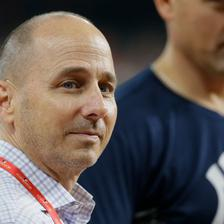

None
Caption:
Cashman, who dismissed reports that hinted at increasing friction between him and Girardi this season or that Girardi did not work well with the analytics staff, also said that Girardi's managerial gaffe in the postseason -- neglecting to call for a replay challenge that may have prevented a loss to the Cleveland Indians in Game 2 of an American League division series -- had nothing to do with his ouster.
True val
Brian Cashman before Game 2 of the American League Championship Series between the Yankees and the Houston Astros. Houston won in seven games and Joe Girardi was let go as manager days later.



['Brian', 'Cashman', 'before', 'Game', '2', 'of', 'the', 'American', 'League', 'Championship', 'Series', 'between', 'the', 'Yankees', 'and', 'the', 'Houston', 'Astros.', 'Houston', 'won', 'in', 'seven', 'games', 'and', 'Joe', 'Girardi', 'was', 'let', 'go', 'as', 'manager', 'days', 'later.']
['Cashman,', 'who', 'dismissed', 'reports', 'that', 'hinted', 'at', 'increasing',

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


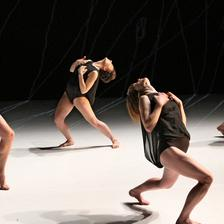

None
Caption:
"Ambient Cowboy," a new work by Ivy Baldwin Dance that opened at New York Live Arts on Wednesday, begins with Ms. Baldwin and Lawrence Cassella on a bare stage.
True val

Ambient Cowboy From left, Lawrence Cassella, Molly Poerstel-Taylor, Ivy Baldwin and Eleanor Smith in a new work by Ms. Baldwin, which continues through Saturday at New York Live Arts.





['Ambient', 'Cowboy', 'From', 'left,', 'Lawrence', 'Cassella,', 'Molly', 'Poerstel-Taylor,', 'Ivy', 'Baldwin', 'and', 'Eleanor', 'Smith', 'in', 'a', 'new', 'work', 'by', 'Ms.', 'Baldwin,', 'which', 'continues', 'through', 'Saturday', 'at', 'New', 'York', 'Live', 'Arts.']
['"Ambient', 'Cowboy,"', 'a', 'new', 'work', 'by', 'Ivy', 'Baldwin', 'Dance', 'that', 'opened', 'at', 'New', 'York', 'Live', 'Arts', 'on', 'Wednesday,', 'begins', 'with', 'Ms.', 'Baldwin', 'and', 'Lawrence', 'Cassella', 'on', 'a', 'bare', 'stage.']
0.5124576721246791
0.8


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


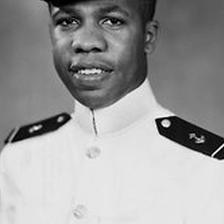

None
Caption:
He first publicly discussed his hazing with the Navy historian Robert J. Schneller Jr., who interviewed him for his 2005 book, "Breaking the Color Barrier: The U.S.
True val

Wesley A. Brown in 1949.





['Wesley', 'A.', 'Brown', 'in', '1949.']
['He', 'first', 'publicly', 'discussed', 'his', 'hazing', 'with', 'the', 'Navy', 'historian', 'Robert', 'J.', 'Schneller', 'Jr.,', 'who', 'interviewed', 'him', 'for', 'his', '2005', 'book,', '"Breaking', 'the', 'Color', 'Barrier:', 'The', 'U.S.']
0
0.0


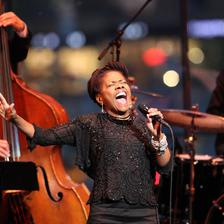

None
Caption:
Ms. Lenox's rendition was more angular and slightly less restrained but entirely true to the spirit of the great Harold Arlen-Ted Koehler torch song and to Waters's version, in which bad weather is a fact of life to be endured with minimal self-pity.
True val

Ethel Waters: Blues, Broadway and Jazz A tribute to the late singer on Wednesday at Lincoln Center included Catherine Russell.





['Ethel', 'Waters:', 'Blues,', 'Broadway', 'and', 'Jazz', 'A', 'tribute', 'to', 'the', 'late', 'singer', 'on', 'Wednesday', 'at', 'Lincoln', 'Center', 'included', 'Catherine', 'Russell.']
['Ms.', "Lenox's", 'rendition', 'was', 'more', 'angular', 'and', 'slightly', 'less', 'restrained', 'but', 'entirely', 'true', 'to', 'the', 'spirit', 'of', 'the', 'great', 'Harold', 'Arlen-Ted', 'Koehler', 'torch', 'song', 'and', 'to', "Waters's", 'version,', 'in', 'which', 'bad', 'weather', 'is', 'a', 'fact', 'of', 'life', 'to', 'be', 'endured', 'with', 'minimal', 'self-pity.']
0.3905106532895161
0.333

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


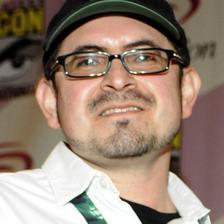

None
Caption:
Marjorie Liu, the Hugo Award-winning writer of "Monstress," said Mr. Berganza's presence at the company kept her from writing for it.
True val
Eddie Berganza, a comics editor, was fired from DC Entertainment on Monday, the company said.



['Eddie', 'Berganza,', 'a', 'comics', 'editor,', 'was', 'fired', 'from', 'DC', 'Entertainment', 'on', 'Monday,', 'the', 'company', 'said.']
['Marjorie', 'Liu,', 'the', 'Hugo', 'Award-winning', 'writer', 'of', '"Monstress,"', 'said', 'Mr.', "Berganza's", 'presence', 'at', 'the', 'company', 'kept', 'her', 'from', 'writing', 'for', 'it.']
0
0.5


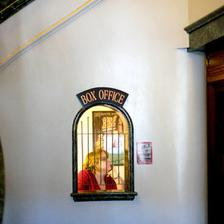

None
Caption:
Most significant, the houses are heated and cooled by geothermal systems that are expected to keep bills down to $100 per house per year.
True val

Inside the Goodspeed Opera House in East Haddam, Conn.





['Inside', 'the', 'Goodspeed', 'Opera', 'House', 'in', 'East', 'Haddam,', 'Conn.']
['Most', 'significant,', 'the', 'houses', 'are', 'heated', 'and', 'cooled', 'by', 'geothermal', 'systems', 'that', 'are', 'expected', 'to', 'keep', 'bills', 'down', 'to', '$100', 'per', 'house', 'per', 'year.']
0
0.0


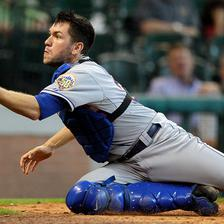

None
Caption:
In his second start of the season, he allowed six hits, two walks and five runs over four innings.
True val

Mets catcher Josh Thole made a diving catch of Wandy Rodriguez's bunt attempt, one of the few highlights for New York.





['Mets', 'catcher', 'Josh', 'Thole', 'made', 'a', 'diving', 'catch', 'of', 'Wandy', "Rodriguez's", 'bunt', 'attempt,', 'one', 'of', 'the', 'few', 'highlights', 'for', 'New', 'York.']
['In', 'his', 'second', 'start', 'of', 'the', 'season,', 'he', 'allowed', 'six', 'hits,', 'two', 'walks', 'and', 'five', 'runs', 'over', 'four', 'innings.']
0
0.0


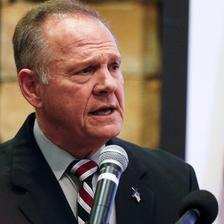

None
Caption:
Senator McConnell and Speaker Ryan should explain why they believe one set of accusers but not the other.
True val
Roy Moore, the Republican nominee for a Senate seat in Alabama, spoke in Birmingham on Saturday. He has called the allegations against him “a desperate political attack.”



['Roy', 'Moore,', 'the', 'Republican', 'nominee', 'for', 'a', 'Senate', 'seat', 'in', 'Alabama,', 'spoke', 'in', 'Birmingham', 'on', 'Saturday.', 'He', 'has', 'called', 'the', 'allegations', 'against', 'him', '“a', 'desperate', 'political', 'attack.”']
['Senator', 'McConnell', 'and', 'Speaker', 'Ryan', 'should', 'explain', 'why', 'they', 'believe', 'one', 'set', 'of', 'accusers', 'but', 'not', 'the', 'other.']
0
0.0


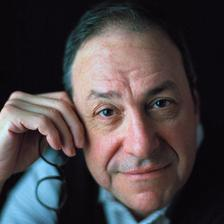

None
Caption:
Last year, the post office announced an ambitious cost-cutting plan, including the closure of 3,700 rural post offices, for potential savings of $6.5 billion.
True val

Joe Nocera





['Joe', 'Nocera']
['Last', 'year,', 'the', 'post', 'office', 'announced', 'an', 'ambitious', 'cost-cutting', 'plan,', 'including', 'the', 'closure', 'of', '3,700', 'rural', 'post', 'offices,', 'for', 'potential', 'savings', 'of', '$6.5', 'billion.']
0
0.0


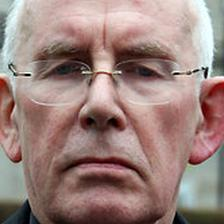

None
Caption:
The BBC program reported that the parents of the children he named said they were not warned by anyone in the church about the danger Father Smyth posed.
True val

Ireland Cardinal Sean Brady





['Ireland', 'Cardinal', 'Sean', 'Brady']
['The', 'BBC', 'program', 'reported', 'that', 'the', 'parents', 'of', 'the', 'children', 'he', 'named', 'said', 'they', 'were', 'not', 'warned', 'by', 'anyone', 'in', 'the', 'church', 'about', 'the', 'danger', 'Father', 'Smyth', 'posed.']
0
0.0


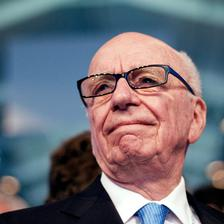

None
Caption:
A judicial investigation into media practices, the Leveson Inquiry, has unearthed endless examples of dubious and unethical behavior from Britain's tabloid newspapers, especially The News of the World, the now-defunct Murdoch-owned paper at the center of the scandal.
True val

Rupert Murdoch in Paris last year. On Tuesday, he sidestepped criticisms of his leadership.





['Rupert', 'Murdoch', 'in', 'Paris', 'last', 'year.', 'On', 'Tuesday,', 'he', 'sidestepped', 'criticisms', 'of', 'his', 'leadership.']
['A', 'judicial', 'investigation', 'into', 'media', 'practices,', 'the', 'Leveson', 'Inquiry,', 'has', 'unearthed', 'endless', 'examples', 'of', 'dubious', 'and', 'unethical', 'behavior', 'from', "Britain's", 'tabloid', 'newspapers,', 'especially', 'The', 'News', 'of', 'the', 'World,', 'the', 'now-defunct', 'Murdoch-owned', 'paper', 'at', 'the', 'center', 'of', 'the', 'scandal.']
0
0.25


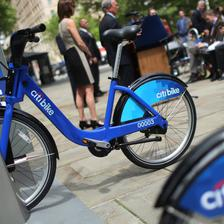

None
Caption:
The name did not come cheaply: Citigroup, which runs Citibank, is paying $41 million to be the lead sponsor of the program for five years, Mayor Michael R. Bloomberg announced on Monday.
True val

Citibank is paying $41 million to be lead sponsor of New York’s bike-sharing plan for five years. At the end of July, the first of some 10,000 rental bikes are scheduled to reach the streets.





['Citibank', 'is', 'paying', '$41', 'million', 'to', 'be', 'lead', 'sponsor', 'of', 'New', 'York’s', 'bike-sharing', 'plan', 'for', 'five', 'years.', 'At', 'the', 'end', 'of', 'July,', 'the', 'first', 'of', 'some', '10,000', 'rental', 'bikes', 'are', 'scheduled', 'to', 'reach', 'the', 'streets.']
['The', 'name', 'did', 'not', 'come', 'cheaply:', 'Citigroup,', 'which', 'runs', 'Citibank,', 'is', 'paying', '$41', 'million', 'to', 'be', 'the', 'lead', 'sponsor', 'of', 'the', 'program', 'for', 'five', 'years,', 'Mayor', 'Michael', 'R.', 'Bloomberg', 'announced', 'on', 'Monday.']
0
0.5


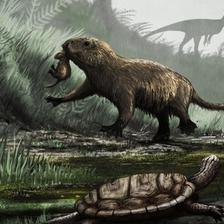

None
Caption:
Mammalogists have long thought the earliest shared ancestor of all mammals was nocturnal, and now a study published Monday provides a potential date for when the furry creatures stopped cowering in the shadows and started venturing into the daylight.
True val
The Kayentatherium, a Mesozoic-era mammal, pictured in this illustration with a pair of Dilophosaurus, background, and the prehistoric turtle Kayentachelys, foreground. A new study suggests that mammals, which were largely nocturnal during the age of dinosaurs, became more active in daytime shortly after the dinosaurs went extinct.



['The', 'Kayentatherium,', 'a', 'Mesozoic-era', 'mammal,', 'pictured', 'in', 'this', 'illustration', 'with', 'a', 'pair', 'of', 'Dilophosaurus,', 'background,', 'and', 'the', 'prehistoric', 'turtle', 'Kayentachelys,', 'foreground.', 'A', 'new', 'study', 'suggests', 'that', 'mammals,', 'which', 'were', 'largely', 'nocturnal', 'during', 'the', 'age', 'of', 'dinosaurs,', 'became', 'more', 

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


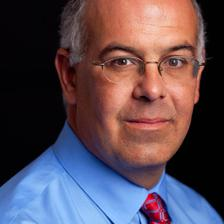

None
Caption:
But it also compels colleges to focus on the rest of the learning process, which is where the real value lies.
True val

David Brooks





['David', 'Brooks']
['But', 'it', 'also', 'compels', 'colleges', 'to', 'focus', 'on', 'the', 'rest', 'of', 'the', 'learning', 'process,', 'which', 'is', 'where', 'the', 'real', 'value', 'lies.']
0


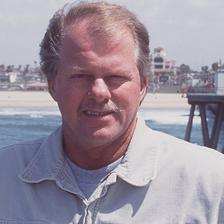

None
Caption:
Forecasts were refined with the help of Jon Chrostowski, a NASA scientist who hacked into data streams broadcast by weather buoys, and William C. O'Reilly, an oceanographer with the Scripps Institute who modeled the interaction of waves with the sea floor.
True val

Sean Collins in 2002 in Huntington Beach, Calif. His business, Surfline, provided up-to-date information on surf conditions.





['Sean', 'Collins', 'in', '2002', 'in', 'Huntington', 'Beach,', 'Calif.', 'His', 'business,', 'Surfline,', 'provided', 'up-to-date', 'information', 'on', 'surf', 'conditions.']
['Forecasts', 'were', 'refined', 'with', 'the', 'help', 'of', 'Jon', 'Chrostowski,', 'a', 'NASA', 'scientist', 'who', 'hacked', 'into', 'data', 'streams', 'broadcast', 'by', 'weather', 'buoys,', 'and', 'William', 'C.', "O'Reilly,", 'an', 'oceanographer', 'with', 'the', 'Scripps', 'Institute', 'who', 'modeled', 'the', 'interaction', 'of', 'waves', 'with', 'the', 'sea', 'floor.']
0.3951882613244048
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


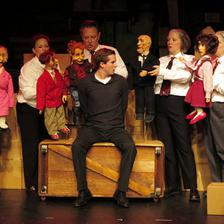

None
Caption:
This is meant literally: "The Life and Times of Lee Harvey Oswald" does not explore the theories that have kept legitimate historians and basement-dwelling conspiracists busy for the past half century; what it does have is a lot of puppets, brought to wobbly life by a cast of eight humans dressed like federal agents, in white shirts and black slacks.
True val
Jeffrey Roth, center, without his puppet, playing the title character in “The Life and Times of Lee Harvey Oswald.” Behind, from left, with dummies: Valois Mickens, Sarah Lafferty, Ben Watts, Michelle Beshaw and Deborah Beshaw-Farrell.



['Jeffrey', 'Roth,', 'center,', 'without', 'his', 'puppet,', 'playing', 'the', 'title', 'character', 'in', '“The', 'Life', 'and', 'Times', 'of', 'Lee', 'Harvey', 'Oswald.”', 'Behind,', 'from', 'left,', 'with', 'dummies:', 'Valois', 'Mickens,', 'Sarah', 'Lafferty,', 'Ben', 'Watts,', 'Michelle', 'Beshaw', 'and', 'Deborah', 'Beshaw-Farrell.']
['This', 'is', 'meant', 'literally:', '"The

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


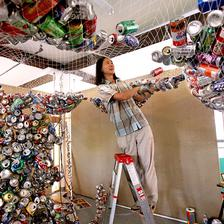

None
Caption:
This weekend "Work-in-Progress: Open Studios" invites the public to see the results.
True val

Chin Chin Yang added cans to his installation in 2010 at the Lower Manhattan Cultural Council's space for artists on Governors Island.





['Chin', 'Chin', 'Yang', 'added', 'cans', 'to', 'his', 'installation', 'in', '2010', 'at', 'the', 'Lower', 'Manhattan', 'Cultural', "Council's", 'space', 'for', 'artists', 'on', 'Governors', 'Island.']
['This', 'weekend', '"Work-in-Progress:', 'Open', 'Studios"', 'invites', 'the', 'public', 'to', 'see', 'the', 'results.']
0


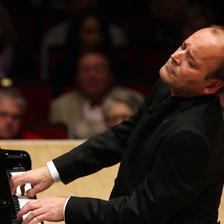

None
Caption:
But if his Beethoven was satisfying, Mr. Lortie's Chopin was deeper and tenser: more engaged, flexibly phrased and moving in both its reflective and thunderous moods.
True val

Louis Lortie: The pianist stepped in to perform standards by Beethoven and Chopin at Carnegie Hall on Sunday, replacing Maurizio Pollini.





['Louis', 'Lortie:', 'The', 'pianist', 'stepped', 'in', 'to', 'perform', 'standards', 'by', 'Beethoven', 'and', 'Chopin', 'at', 'Carnegie', 'Hall', 'on', 'Sunday,', 'replacing', 'Maurizio', 'Pollini.']
['But', 'if', 'his', 'Beethoven', 'was', 'satisfying,', 'Mr.', "Lortie's", 'Chopin', 'was', 'deeper', 'and', 'tenser:', 'more', 'engaged,', 'flexibly', 'phrased', 'and', 'moving', 'in', 'both', 'its', 'reflective', 'and', 'thunderous', 'moods.']
0
1.0


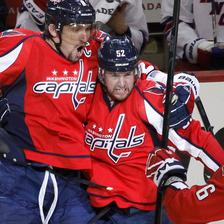

None
Caption:
Washington Coach Dale Hunter said Lundqvist played well throughout, but he liked how his offensive players kept pressing the issue in the Rangers' end.
True val

Washington’s Mike Green, center, after his third-period goal. Green scored only three times in the regular season.





['Washington’s', 'Mike', 'Green,', 'center,', 'after', 'his', 'third-period', 'goal.', 'Green', 'scored', 'only', 'three', 'times', 'in', 'the', 'regular', 'season.']
['Washington', 'Coach', 'Dale', 'Hunter', 'said', 'Lundqvist', 'played', 'well', 'throughout,', 'but', 'he', 'liked', 'how', 'his', 'offensive', 'players', 'kept', 'pressing', 'the', 'issue', 'in', 'the', "Rangers'", 'end.']
0
0.3333333333333333


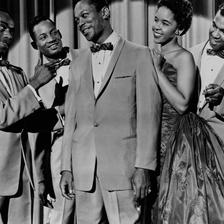

None
Caption:
The cause was lung disease, said his manager, Fred Balboni.
True val

The Platters: from left, Herb Reed, David Lynch, Tony Williams, Zola Taylor and Paul Robi.





['The', 'Platters:', 'from', 'left,', 'Herb', 'Reed,', 'David', 'Lynch,', 'Tony', 'Williams,', 'Zola', 'Taylor', 'and', 'Paul', 'Robi.']
['The', 'cause', 'was', 'lung', 'disease,', 'said', 'his', 'manager,', 'Fred', 'Balboni.']
0
0.0


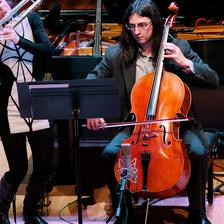

None
Caption:
The Finnish composer Kaija Saariaho's music seems to be high on its list of keepers, and understandably so: Ms. Saariaho's colorful, involving scores keep listeners transfixed and reward repeat hearings.
True val

International Contemporary Ensemble, including Claire Chase, far left, and Kivie Cahn-Lipman, performed the music of Kaija Saariaho at Roulette in Brooklyn on Wednesday.





['International', 'Contemporary', 'Ensemble,', 'including', 'Claire', 'Chase,', 'far', 'left,', 'and', 'Kivie', 'Cahn-Lipman,', 'performed', 'the', 'music', 'of', 'Kaija', 'Saariaho', 'at', 'Roulette', 'in', 'Brooklyn', 'on', 'Wednesday.']
['The', 'Finnish', 'composer', 'Kaija', "Saariaho's", 'music', 'seems', 'to', 'be', 'high', 'on', 'its', 'list', 'of', 'keepers,', 'and', 'understandably', 'so:', 'Ms.', "Saariaho's", 'colorful,', 'involving', 'scores', 'keep', 'listeners', 'transfixed', 'and', 'reward', 'repeat', 'hearings.']
0
0.3333333333333333


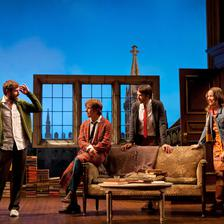

None
Caption:
The problem is that from the first scene -- set in the Cambridge rooms of an undergraduate named Stuart Thorne (Josh Cooke) -- so can we.
True val

The Common Pursuit From left, Jacob Fishel, Josh Cooke, Lucas Near-Verbrugghe, Kieran Campion, Kristen Bush and Tim McGeever in a revival of this play by Simon Gray.





['The', 'Common', 'Pursuit', 'From', 'left,', 'Jacob', 'Fishel,', 'Josh', 'Cooke,', 'Lucas', 'Near-Verbrugghe,', 'Kieran', 'Campion,', 'Kristen', 'Bush', 'and', 'Tim', 'McGeever', 'in', 'a', 'revival', 'of', 'this', 'play', 'by', 'Simon', 'Gray.']
['The', 'problem', 'is', 'that', 'from', 'the', 'first', 'scene', '--', 'set', 'in', 'the', 'Cambridge', 'rooms', 'of', 'an', 'undergraduate', 'named', 'Stuart', 'Thorne', '(Josh', 'Cooke)', '--', 'so', 'can', 'we.']
0
0.25


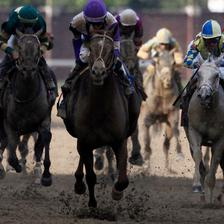

None
Caption:
Or do you want to wait the extra time and go to the Belmont and space his races out?'
True val

I’ll Have Another, who carried Mario Gutierrez to victory in the Kentucky Derby, can win the second leg of the Triple Crown at the Preakness Stakes on May 19. “I get goose bumps just thinking about it,” said the colt’s trainer, Doug O’Neill, right.





['I’ll', 'Have', 'Another,', 'who', 'carried', 'Mario', 'Gutierrez', 'to', 'victory', 'in', 'the', 'Kentucky', 'Derby,', 'can', 'win', 'the', 'second', 'leg', 'of', 'the', 'Triple', 'Crown', 'at', 'the', 'Preakness', 'Stakes', 'on', 'May', '19.', '“I', 'get', 'goose', 'bumps', 'just', 'thinking', 'about', 'it,”', 'said', 'the', 'colt’s', 'trainer,', 'Doug', 'O’Neill,', 'right.']
['Or', 'do', 'you', 'want', 'to', 'wait', 'the', 'extra', 'time', 'and', 'go', 'to', 'the', 'Belmont', 'and', 'space', 'his', 'races', "out?'"]
0
0.0


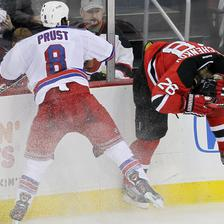

None
Caption:
Stepan, a second-year player, was more coy than Richards.
True val

Both coaches had something to complain about after Game 3. For Devils Coach Peter DeBoer, it was Brandon Prust's hit on Anton Volchenkov.





['Both', 'coaches', 'had', 'something', 'to', 'complain', 'about', 'after', 'Game', '3.', 'For', 'Devils', 'Coach', 'Peter', 'DeBoer,', 'it', 'was', 'Brandon', "Prust's", 'hit', 'on', 'Anton', 'Volchenkov.']
['Stepan,', 'a', 'second-year', 'player,', 'was', 'more', 'coy', 'than', 'Richards.']
0.5773502691896257
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


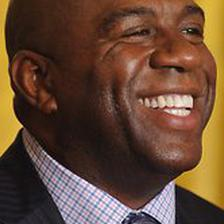

None
Caption:
"Dodger fans are clamoring for stability," said David Carter, the director of the sports business institute at the University of Southern California Marshall School of Business, "and they can't wait to have an owner who they feel has a vested interest in what they believe is their team.
True val

Magic Johnson is in a group that includes the ex-baseball executive Stan Kasten.





['Magic', 'Johnson', 'is', 'in', 'a', 'group', 'that', 'includes', 'the', 'ex-baseball', 'executive', 'Stan', 'Kasten.']
['"Dodger', 'fans', 'are', 'clamoring', 'for', 'stability,"', 'said', 'David', 'Carter,', 'the', 'director', 'of', 'the', 'sports', 'business', 'institute', 'at', 'the', 'University', 'of', 'Southern', 'California', 'Marshall', 'School', 'of', 'Business,', '"and', 'they', "can't", 'wait', 'to', 'have', 'an', 'owner', 'who', 'they', 'feel', 'has', 'a', 'vested', 'interest', 'in', 'what', 'they', 'believe', 'is', 'their', 'team.']
0.37991784282579627
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


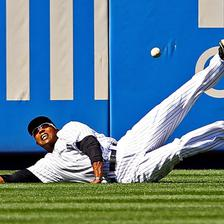

None
Caption:
Cueto settled down in the seventh, retiring the Yankees in order.
True val

The Yankees' Dewayne Wise failed to come up with a double by the Reds' Ryan Ludwick in the ninth inning. Two runners scored.





['The', "Yankees'", 'Dewayne', 'Wise', 'failed', 'to', 'come', 'up', 'with', 'a', 'double', 'by', 'the', "Reds'", 'Ryan', 'Ludwick', 'in', 'the', 'ninth', 'inning.', 'Two', 'runners', 'scored.']
['Cueto', 'settled', 'down', 'in', 'the', 'seventh,', 'retiring', 'the', 'Yankees', 'in', 'order.']
0
0.3333333333333333


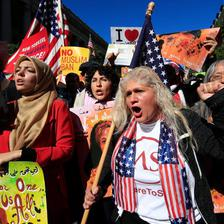

None
Caption:
LOS ANGELES -- A federal appeals court in California on Monday allowed President Trump's latest travel restrictions to partly take effect, ruling that the government can bar entry to people who come from six majority-Muslim countries and who lack ties to the United States, thus handing the administration a momentary victory.
True val
Muslim groups and other activists protesting the Trump administration’s new travel ban last month in Washington.



['Muslim', 'groups', 'and', 'other', 'activists', 'protesting', 'the', 'Trump', 'administration’s', 'new', 'travel', 'ban', 'last', 'month', 'in', 'Washington.']
['LOS', 'ANGELES', '--', 'A', 'federal', 'appeals', 'court', 'in', 'California', 'on', 'Monday', 'allowed', 'President', "Trump's", 'latest', 'travel', 'restrictions', 'to', 'partly', 'take', 'effect,', 'ruling', 'that', 'the', 'government', 'can', 'bar', 'entry', 'to', 'people', 'who', 'come', 'from', 'six', 'majority-Muslim', 'countries', 'and', 'who', 'lack', 'ties',

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


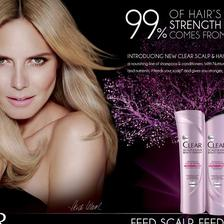

None
Caption:
Too often, such a sales angle "feels like marketing-speak," said Helen Bell, chief operating officer at Lowe & Partners, but "this is a very different story we're telling, telling women they need to feed their scalp."
True val

Heidi Klum will be the face of Unilever’s campaign to introduce the Clear brand of hair-care products to American consumers.




['Heidi', 'Klum', 'will', 'be', 'the', 'face', 'of', 'Unilever’s', 'campaign', 'to', 'introduce', 'the', 'Clear', 'brand', 'of', 'hair-care', 'products', 'to', 'American', 'consumers.']
['Too', 'often,', 'such', 'a', 'sales', 'angle', '"feels', 'like', 'marketing-speak,"', 'said', 'Helen', 'Bell,', 'chief', 'operating', 'officer', 'at', 'Lowe', '&', 'Partners,', 'but', '"this', 'is', 'a', 'very', 'different', 'story', "we're", 'telling,', 'telling', 'women', 'they', 'need', 'to', 'feed', 'their', 'scalp."']
0.4854917717073234
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


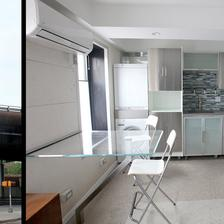

None
Caption:
Solar panels alone cannot generate enough energy to reduce a building's usage to zero.
True val

TEST BUILDING The Delta in Carroll Gardens, which has been built to run entirely on solar energy, is a showroom for a “net-zero” rental planned for Park Slope. added: Above right, Ronald F. Faia of Voltaic Solaire, the developer.




['TEST', 'BUILDING', 'The', 'Delta', 'in', 'Carroll', 'Gardens,', 'which', 'has', 'been', 'built', 'to', 'run', 'entirely', 'on', 'solar', 'energy,', 'is', 'a', 'showroom', 'for', 'a', '“net-zero”', 'rental', 'planned', 'for', 'Park', 'Slope.', 'added:', 'Above', 'right,', 'Ronald', 'F.', 'Faia', 'of', 'Voltaic', 'Solaire,', 'the', 'developer.']
['Solar', 'panels', 'alone', 'cannot', 'generate', 'enough', 'energy', 'to', 'reduce', 'a', "building's", 'usage', 'to', 'zero.']
0.5169731539571706
1.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


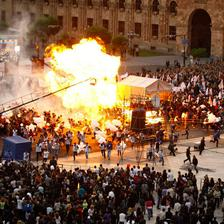

None
Caption:
More than 60 people, including children, were hospitalized after the explosion, and photographs showed bystanders fleeing as flames shot up in a crowded square.
True val

An explosion injured at least 144 in central Yerevan on Friday during a campaign rally by Armenia's ruling party.





['An', 'explosion', 'injured', 'at', 'least', '144', 'in', 'central', 'Yerevan', 'on', 'Friday', 'during', 'a', 'campaign', 'rally', 'by', "Armenia's", 'ruling', 'party.']
['More', 'than', '60', 'people,', 'including', 'children,', 'were', 'hospitalized', 'after', 'the', 'explosion,', 'and', 'photographs', 'showed', 'bystanders', 'fleeing', 'as', 'flames', 'shot', 'up', 'in', 'a', 'crowded', 'square.']
0.4518010018049224
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


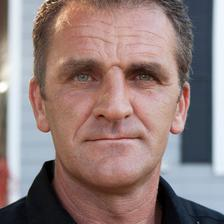

None
Caption:
Writing in USA Today last August, Mr. Thornburgh and Bob Barr, a former Republican congressman and federal prosecutor, said "it is our moral duty to provide protection to those who risk retribution in the name of justice" and urged the federal government to take prompt action.
True val

Edmond Demiraj





['Edmond', 'Demiraj']
['Writing', 'in', 'USA', 'Today', 'last', 'August,', 'Mr.', 'Thornburgh', 'and', 'Bob', 'Barr,', 'a', 'former', 'Republican', 'congressman', 'and', 'federal', 'prosecutor,', 'said', '"it', 'is', 'our', 'moral', 'duty', 'to', 'provide', 'protection', 'to', 'those', 'who', 'risk', 'retribution', 'in', 'the', 'name', 'of', 'justice"', 'and', 'urged', 'the', 'federal', 'government', 'to', 'take', 'prompt', 'action.']
0.3839817133079349
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


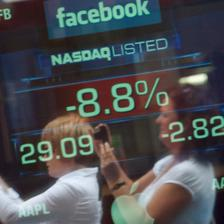

None
Caption:
On Tuesday, as shares of Facebook were trading at roughly 24 percent below their offering price, rivals like LinkedIn were up.
True val

Pedestrians reflected in a window near a display of the share price for Facebook.





['Pedestrians', 'reflected', 'in', 'a', 'window', 'near', 'a', 'display', 'of', 'the', 'share', 'price', 'for', 'Facebook.']
['On', 'Tuesday,', 'as', 'shares', 'of', 'Facebook', 'were', 'trading', 'at', 'roughly', '24', 'percent', 'below', 'their', 'offering', 'price,', 'rivals', 'like', 'LinkedIn', 'were', 'up.']
0
0.0


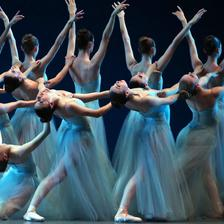

None
Caption:
Each of the music's four movements is led by a different couple, and it's easy at first to feel that these are four separate ballets.
True val

A scene in Balanchine’s “Serenade” during the opening night of City Ballet’s spring season at the David H. Koch Theater at Lincoln Center.





['A', 'scene', 'in', 'Balanchine’s', '“Serenade”', 'during', 'the', 'opening', 'night', 'of', 'City', 'Ballet’s', 'spring', 'season', 'at', 'the', 'David', 'H.', 'Koch', 'Theater', 'at', 'Lincoln', 'Center.']
['Each', 'of', 'the', "music's", 'four', 'movements', 'is', 'led', 'by', 'a', 'different', 'couple,', 'and', "it's", 'easy', 'at', 'first', 'to', 'feel', 'that', 'these', 'are', 'four', 'separate', 'ballets.']
0.447213595499958
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


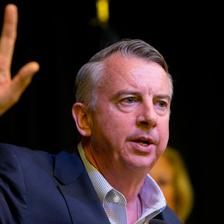

None
Caption:
George W. Bush has even lamented that he may turn out to have been the "last Republican president," because Donald Trump represents something so alien to the party's tradition.
True val
Ed Gillespie, Republican candidate for governor in Virginia, has run a campaign focused on stirring up white racial hostility.



['Ed', 'Gillespie,', 'Republican', 'candidate', 'for', 'governor', 'in', 'Virginia,', 'has', 'run', 'a', 'campaign', 'focused', 'on', 'stirring', 'up', 'white', 'racial', 'hostility.']
['George', 'W.', 'Bush', 'has', 'even', 'lamented', 'that', 'he', 'may', 'turn', 'out', 'to', 'have', 'been', 'the', '"last', 'Republican', 'president,"', 'because', 'Donald', 'Trump', 'represents', 'something', 'so', 'alien', 'to', 'the', "party's", 'tradition.']
0
0.3333333333333333


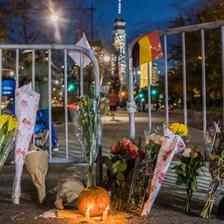

None
Caption:
After offering his condolences on Twitter, Mr. Trump suggested shootings were not always preventable in an Oct. 2 interview on MSNBC.
True val
A memorial set up on a bike path in Manhattan where a man killed eight people with a truck last week. President Trump said the suspect should be put to death.



['A', 'memorial', 'set', 'up', 'on', 'a', 'bike', 'path', 'in', 'Manhattan', 'where', 'a', 'man', 'killed', 'eight', 'people', 'with', 'a', 'truck', 'last', 'week.', 'President', 'Trump', 'said', 'the', 'suspect', 'should', 'be', 'put', 'to', 'death.']
['After', 'offering', 'his', 'condolences', 'on', 'Twitter,', 'Mr.', 'Trump', 'suggested', 'shootings', 'were', 'not', 'always', 'preventable', 'in', 'an', 'Oct.', '2', 'interview', 'on', 'MSNBC.']
0
0.3333333333333333


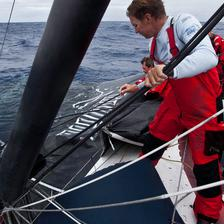

None
Caption:
After the Mar Mostro mast broke, Worthington said, "The first question was, 'Do we try to finish?'
True val

The Puma team was 2,150 nautical miles from the first finish line of the Volvo Ocean Race when it sustained a broken mast.





['The', 'Puma', 'team', 'was', '2,150', 'nautical', 'miles', 'from', 'the', 'first', 'finish', 'line', 'of', 'the', 'Volvo', 'Ocean', 'Race', 'when', 'it', 'sustained', 'a', 'broken', 'mast.']
['After', 'the', 'Mar', 'Mostro', 'mast', 'broke,', 'Worthington', 'said,', '"The', 'first', 'question', 'was,', "'Do", 'we', 'try', 'to', "finish?'"]
0
0.5


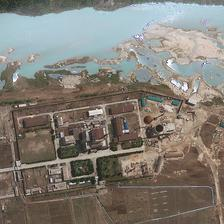

None
Caption:
SEOUL, South Korea -- North Korea has resumed construction of a nuclear reactor that can be used to expand the country's nuclear weapons program, an American-based institute said Thursday, citing the latest satellite imagery of the building site.
True val

A satellite image from April 30, 2012, shows the area around the Yongbyon nuclear facility in North Korea.





['A', 'satellite', 'image', 'from', 'April', '30,', '2012,', 'shows', 'the', 'area', 'around', 'the', 'Yongbyon', 'nuclear', 'facility', 'in', 'North', 'Korea.']
['SEOUL,', 'South', 'Korea', '--', 'North', 'Korea', 'has', 'resumed', 'construction', 'of', 'a', 'nuclear', 'reactor', 'that', 'can', 'be', 'used', 'to', 'expand', 'the', "country's", 'nuclear', 'weapons', 'program,', 'an', 'American-based', 'institute', 'said', 'Thursday,', 'citing', 'the', 'latest', 'satellite', 'imagery', 'of', 'the', 'building', 'site.']
0.40276720463657734
0.25


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


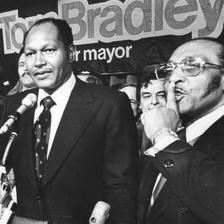

None
Caption:
Bishop Brookins had a knack for getting to the point in a pithy way.
True val

H. H. Brookins, right, with Mayor Tom Bradley of Los Angeles in 1973. Bishop Brookins helped start Mr. Bradley’s career.





['H.', 'H.', 'Brookins,', 'right,', 'with', 'Mayor', 'Tom', 'Bradley', 'of', 'Los', 'Angeles', 'in', '1973.', 'Bishop', 'Brookins', 'helped', 'start', 'Mr.', 'Bradley’s', 'career.']
['Bishop', 'Brookins', 'had', 'a', 'knack', 'for', 'getting', 'to', 'the', 'point', 'in', 'a', 'pithy', 'way.']
0.5169731539571706
1.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


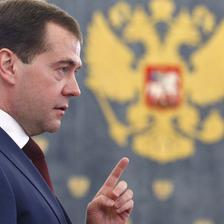

None
Caption:
That theory does not account for Mr. Putin's character, or the debt he now owes Mr. Medvedev for stepping down, said Olga V. Kryshtanovskaya, a sociologist who is a member of United Russia.
True val

Dmitri A. Medvedev speaking to members of his United Russia party last Friday. Some in Moscow speculate he will not last long as prime minister.





['Dmitri', 'A.', 'Medvedev', 'speaking', 'to', 'members', 'of', 'his', 'United', 'Russia', 'party', 'last', 'Friday.', 'Some', 'in', 'Moscow', 'speculate', 'he', 'will', 'not', 'last', 'long', 'as', 'prime', 'minister.']
['That', 'theory', 'does', 'not', 'account', 'for', 'Mr.', "Putin's", 'character,', 'or', 'the', 'debt', 'he', 'now', 'owes', 'Mr.', 'Medvedev', 'for', 'stepping', 'down,', 'said', 'Olga', 'V.', 'Kryshtanovskaya,', 'a', 'sociologist', 'who', 'is', 'a', 'member', 'of', 'United', 'Russia.']
0.4172261448611506
0.5


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


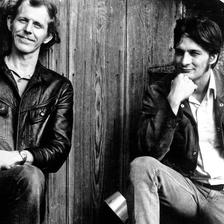

None
Caption:
In 1968 Doug Dillard left the Dillards -- the split was apparently amicable, and the group continued without him -- and teamed with the singer, guitarist and songwriter Gene Clark, a founding member of the pioneering folk-rock band the Byrds.
True val

Doug Dillard, left, with Gene Clark, one of the founders of the Byrds. The men formed their own duo, Dillard and Clark.





['Doug', 'Dillard,', 'left,', 'with', 'Gene', 'Clark,', 'one', 'of', 'the', 'founders', 'of', 'the', 'Byrds.', 'The', 'men', 'formed', 'their', 'own', 'duo,', 'Dillard', 'and', 'Clark.']
['In', '1968', 'Doug', 'Dillard', 'left', 'the', 'Dillards', '--', 'the', 'split', 'was', 'apparently', 'amicable,', 'and', 'the', 'group', 'continued', 'without', 'him', '--', 'and', 'teamed', 'with', 'the', 'singer,', 'guitarist', 'and', 'songwriter', 'Gene', 'Clark,', 'a', 'founding', 'member', 'of', 'the', 'pioneering', 'folk-rock', 'band', 'the', 'Byrds.']
0.3976353643835253
0.75


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


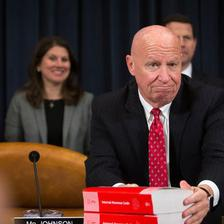

None
Caption:
WASHINGTON -- Republicans outlined significant changes on Monday to the sweeping tax bill unveiled by House lawmakers last week, moving to tighten restrictions on so-called carried interest, alter rules aimed at preventing American companies from stashing profits offshore and further restrict a tax credit claimed primarily by low- and middle-income individuals.
True val
Representative Kevin Brady, the Republican chairman of the House Ways and Means Committee, brought copies of the Internal Revenue Code to a hearing on the new tax bill on Monday.



['Representative', 'Kevin', 'Brady,', 'the', 'Republican', 'chairman', 'of', 'the', 'House', 'Ways', 'and', 'Means', 'Committee,', 'brought', 'copies', 'of', 'the', 'Internal', 'Revenue', 'Code', 'to', 'a', 'hearing', 'on', 'the', 'new', 'tax', 'bill', 'on', 'Monday.']
['WASHINGTON', '--', 'Republicans', 'outlined', 'significant', 'changes', 'on', 'Monday', 'to', 'the', 'sweeping', 'tax', 'bill', 'unveiled', 'by', 'House', 'law

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


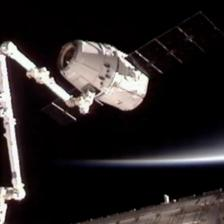

None
Caption:
SpaceX did run into some difficulties with Dragon's navigation sensors, one that took thermal images and one that bounced laser pulses, and that delayed the capture by a couple of hours.
True val

A robotic arm on the International Space Station grabbed onto a cargo capsule from the SpaceX spacecraft.





['A', 'robotic', 'arm', 'on', 'the', 'International', 'Space', 'Station', 'grabbed', 'onto', 'a', 'cargo', 'capsule', 'from', 'the', 'SpaceX', 'spacecraft.']
['SpaceX', 'did', 'run', 'into', 'some', 'difficulties', 'with', "Dragon's", 'navigation', 'sensors,', 'one', 'that', 'took', 'thermal', 'images', 'and', 'one', 'that', 'bounced', 'laser', 'pulses,', 'and', 'that', 'delayed', 'the', 'capture', 'by', 'a', 'couple', 'of', 'hours.']
0.42379865741502165
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


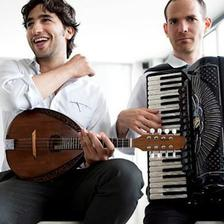

None
Caption:
The recent outpouring of musical talent from Israel represents a different strain of Jewish jazz, one less concerned about connecting with a distant heritage.
True val

The mandolinist Avi Avital and the accordionist Uri Sharlin will perform at Jazzrael.





['The', 'mandolinist', 'Avi', 'Avital', 'and', 'the', 'accordionist', 'Uri', 'Sharlin', 'will', 'perform', 'at', 'Jazzrael.']
['The', 'recent', 'outpouring', 'of', 'musical', 'talent', 'from', 'Israel', 'represents', 'a', 'different', 'strain', 'of', 'Jewish', 'jazz,', 'one', 'less', 'concerned', 'about', 'connecting', 'with', 'a', 'distant', 'heritage.']
0.537284965911771
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


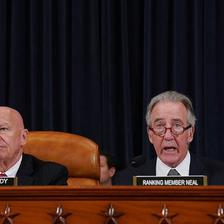

None
Caption:
The social vision embedded in the House Republican tax plan is straightforward: to take money away from affluent professionals in blue states and to pump up corporations as the engine for broad economic growth.
True val
Kevin Brady, a Republican, and Richard Neal, a Democrat, during the House Ways and Means Committee’s first markup of the Republican tax plan.



['Kevin', 'Brady,', 'a', 'Republican,', 'and', 'Richard', 'Neal,', 'a', 'Democrat,', 'during', 'the', 'House', 'Ways', 'and', 'Means', 'Committee’s', 'first', 'markup', 'of', 'the', 'Republican', 'tax', 'plan.']
['The', 'social', 'vision', 'embedded', 'in', 'the', 'House', 'Republican', 'tax', 'plan', 'is', 'straightforward:', 'to', 'take', 'money', 'away', 'from', 'affluent', 'professionals', 'in', 'blue', 'states', 'and', 'to', 'pump', 'up', 'corporations', 'as', 'the', 'engine', 'for', 'broad', 'economic', 'growth.']
0
1.0


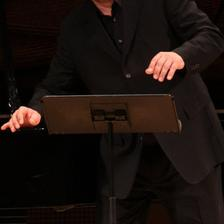

None
Caption:
A program note pointed to the appropriateness of the combination: Shostakovich admired Mahler's music and emulated certain aspects of his forebear's style.
True val

Matthias Goerne, the baritone, above, performed with the pianist Leif Ove Andsnes at Carnegie Hall on Tuesday evening.





['Matthias', 'Goerne,', 'the', 'baritone,', 'above,', 'performed', 'with', 'the', 'pianist', 'Leif', 'Ove', 'Andsnes', 'at', 'Carnegie', 'Hall', 'on', 'Tuesday', 'evening.']
['A', 'program', 'note', 'pointed', 'to', 'the', 'appropriateness', 'of', 'the', 'combination:', 'Shostakovich', 'admired', "Mahler's", 'music', 'and', 'emulated', 'certain', 'aspects', 'of', 'his', "forebear's", 'style.']
0.46173663094410267
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


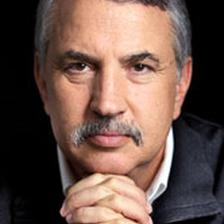

None
Caption:
Finally, how did Obama ever allow this duality to take hold: "The " versus the "Obama bailout"?
True val

Thomas L. Friedman





['Thomas', 'L.', 'Friedman']
['Finally,', 'how', 'did', 'Obama', 'ever', 'allow', 'this', 'duality', 'to', 'take', 'hold:', '"The', '"', 'versus', 'the', '"Obama', 'bailout"?']
0


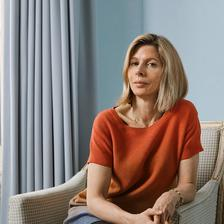

None
Caption:
When we were beleaguered young reporters and felt particularly sorry for ourselves, Connie and I would go to the Little Pie Company's shop down the street from the office, buy one of the smaller versions of the sour-cream apple pie, take it back to the Times cafeteria, and split it for lunch -- no main course or anything, just us and two forks with which we ate directly from the tinfoil container.
True val
Sarah Lyall



['Sarah', 'Lyall']
['When', 'we', 'were', 'beleaguered', 'young', 'reporters', 'and', 'felt', 'particularly', 'sorry', 'for', 'ourselves,', 'Connie', 'and', 'I', 'would', 'go', 'to', 'the', 'Little', 'Pie', "Company's", 'shop', 'down', 'the', 'street', 'from', 'the', 'office,', 'buy', 'one', 'of', 'the', 'smaller', 'versions', 'of', 'the', 'sour-cream', 'apple', 'pie,', 'take', 'it', 'back', 'to', 'the', 'Times', 'cafeteria,', 'and', 'split', 'it', 'for', 'lunch', '--', 'no', 'main', 'course', 'or', 'anything,', 'just', 'us', 'and', 'two', 'forks', 'with'

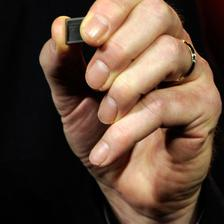

None
Caption:
That makes Broadcom's roughly $105 billion unsolicited offer for Qualcomm on Monday all the more edgy.
True val
A Qualcomm Snapdragon chip, used in smartphones and tablets. Broadcom is willing to pay Qualcomm shareholders a 28 percent premium over last Thursday’s closing stock price.



['A', 'Qualcomm', 'Snapdragon', 'chip,', 'used', 'in', 'smartphones', 'and', 'tablets.', 'Broadcom', 'is', 'willing', 'to', 'pay', 'Qualcomm', 'shareholders', 'a', '28', 'percent', 'premium', 'over', 'last', 'Thursday’s', 'closing', 'stock', 'price.']
['That', 'makes', "Broadcom's", 'roughly', '$105', 'billion', 'unsolicited', 'offer', 'for', 'Qualcomm', 'on', 'Monday', 'all', 'the', 'more', 'edgy.']
0
0.6666666666666666


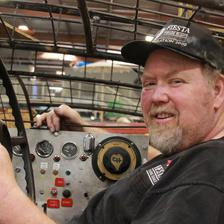

None
Caption:
TIM ESTES, the president of Fiesta Parade Floats, remembers when the Rose Parade rulebook ran 20 pages.
True val

FLOWER POWER Tim Estes of Fiesta Parade Floats at the wheel of the Girl Scouts' 2012 entry.





['FLOWER', 'POWER', 'Tim', 'Estes', 'of', 'Fiesta', 'Parade', 'Floats', 'at', 'the', 'wheel', 'of', 'the', 'Girl', "Scouts'", '2012', 'entry.']
['TIM', 'ESTES,', 'the', 'president', 'of', 'Fiesta', 'Parade', 'Floats,', 'remembers', 'when', 'the', 'Rose', 'Parade', 'rulebook', 'ran', '20', 'pages.']
0
1.0


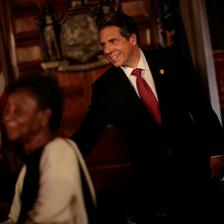

None
Caption:
The Assembly speaker, Sheldon Silver, a Democrat, and the Senate majority leader, Dean G. Skelos, a Republican, appeared alongside the governor at a news conference when he unveiled the new proposals and had nice things to say about him and his ideas.
True val

Gov. Andrew M. Cuomo after announcing legislation Monday to create a state agency that would fight abuse of disabled patients.





['Gov.', 'Andrew', 'M.', 'Cuomo', 'after', 'announcing', 'legislation', 'Monday', 'to', 'create', 'a', 'state', 'agency', 'that', 'would', 'fight', 'abuse', 'of', 'disabled', 'patients.']
['The', 'Assembly', 'speaker,', 'Sheldon', 'Silver,', 'a', 'Democrat,', 'and', 'the', 'Senate', 'majority', 'leader,', 'Dean', 'G.', 'Skelos,', 'a', 'Republican,', 'appeared', 'alongside', 'the', 'governor', 'at', 'a', 'news', 'conference', 'when', 'he', 'unveiled', 'the', 'new', 'proposals', 'and', 'had', 'nice', 'things', 'to', 'say', 'about', 'him', 'and', 'his', 'ideas.']
0.392814650900513
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


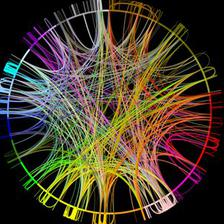

None
Caption:
Dr. Lederberg, who coined a few scientific terms himself, contributed "microbiome" -- all the microbes that live in and on humans -- to the growing trend.
True val

Visualizations, in progressively greater detail, that show duplications within the human genome.





['Visualizations,', 'in', 'progressively', 'greater', 'detail,', 'that', 'show', 'duplications', 'within', 'the', 'human', 'genome.']
['Dr.', 'Lederberg,', 'who', 'coined', 'a', 'few', 'scientific', 'terms', 'himself,', 'contributed', '"microbiome"', '--', 'all', 'the', 'microbes', 'that', 'live', 'in', 'and', 'on', 'humans', '--', 'to', 'the', 'growing', 'trend.']
0.4428500142691474
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


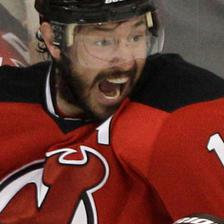

None
Caption:
The Kings, too, have moved on, with their general manager, Dean Lombardi, saying Tuesday of losing the Kovalchuk sweepstakes, "I still thought we had to find some other pieces."
True val

Ilya Kovalchuk is in his first Stanley Cup finals, playing for the Devils, who traded for him, against the Kings, who sought him as a free agent.





['Ilya', 'Kovalchuk', 'is', 'in', 'his', 'first', 'Stanley', 'Cup', 'finals,', 'playing', 'for', 'the', 'Devils,', 'who', 'traded', 'for', 'him,', 'against', 'the', 'Kings,', 'who', 'sought', 'him', 'as', 'a', 'free', 'agent.']
['The', 'Kings,', 'too,', 'have', 'moved', 'on,', 'with', 'their', 'general', 'manager,', 'Dean', 'Lombardi,', 'saying', 'Tuesday', 'of', 'losing', 'the', 'Kovalchuk', 'sweepstakes,', '"I', 'still', 'thought', 'we', 'had', 'to', 'find', 'some', 'other', 'pieces."']
0
0.6666666666666666


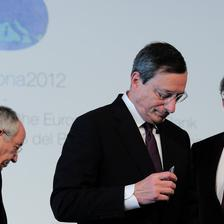

None
Caption:
The government temporarily suspended the Schengen agreement, the European treaty that allows free cross-border travel, over concerns that violent protesters might travel to Barcelona.
True val

Mario Draghi, center, the president of the European Central Bank, said he expected the euro zone’s economy to “recover gradually in the course of the year.”





['Mario', 'Draghi,', 'center,', 'the', 'president', 'of', 'the', 'European', 'Central', 'Bank,', 'said', 'he', 'expected', 'the', 'euro', 'zone’s', 'economy', 'to', '“recover', 'gradually', 'in', 'the', 'course', 'of', 'the', 'year.”']
['The', 'government', 'temporarily', 'suspended', 'the', 'Schengen', 'agreement,', 'the', 'European', 'treaty', 'that', 'allows', 'free', 'cross-border', 'travel,', 'over', 'concerns', 'that', 'violent', 'protesters', 'might', 'travel', 'to', 'Barcelona.']
0
0.3333333333333333


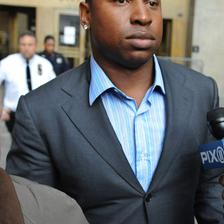

None
Caption:
The police said that a "heavily intoxicated" Young was standing outside the Hilton New York on Avenue of the Americas around 2:30 a.m. Friday when a group of four men were approached by a panhandler wearing a skullcap and a Star of David around his neck who asked them for money.
True val

The police said Delmon Young screamed anti-Semitic epithets at several men.





['The', 'police', 'said', 'Delmon', 'Young', 'screamed', 'anti-Semitic', 'epithets', 'at', 'several', 'men.']
['The', 'police', 'said', 'that', 'a', '"heavily', 'intoxicated"', 'Young', 'was', 'standing', 'outside', 'the', 'Hilton', 'New', 'York', 'on', 'Avenue', 'of', 'the', 'Americas', 'around', '2:30', 'a.m.', 'Friday', 'when', 'a', 'group', 'of', 'four', 'men', 'were', 'approached', 'by', 'a', 'panhandler', 'wearing', 'a', 'skullcap', 'and', 'a', 'Star', 'of', 'David', 'around', 'his', 'neck', 'who', 'asked', 'them', 'for', 'money.']
0.3742031646082125
0.16666666666666666


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


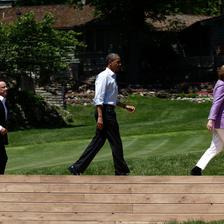

None
Caption:
Ms. Merkel and Mr. Obama met privately after the meeting ended.
True val

From left, Stephen Harper of Canada, François Hollande of France, President Obama and Angela Merkel of Germany.





['From', 'left,', 'Stephen', 'Harper', 'of', 'Canada,', 'François', 'Hollande', 'of', 'France,', 'President', 'Obama', 'and', 'Angela', 'Merkel', 'of', 'Germany.']
['Ms.', 'Merkel', 'and', 'Mr.', 'Obama', 'met', 'privately', 'after', 'the', 'meeting', 'ended.']
0
1.0


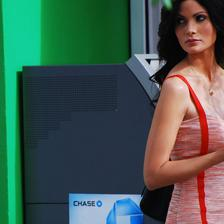

None
Caption:
Until January, the network carried programming created by the Mexican TV giant Televisa, which limited options for brand integration since the shows were already filmed before being distributed through Univision.
True val

Cynthia Olavrria, star of Telemundo's Web mini-novela, "Y Vuelo a  Ti," after making a deposit at a Chase ATM.





['Cynthia', 'Olavrria,', 'star', 'of', "Telemundo's", 'Web', 'mini-novela,', '"Y', 'Vuelo', 'a', 'Ti,"', 'after', 'making', 'a', 'deposit', 'at', 'a', 'Chase', 'ATM.']
['Until', 'January,', 'the', 'network', 'carried', 'programming', 'created', 'by', 'the', 'Mexican', 'TV', 'giant', 'Televisa,', 'which', 'limited', 'options', 'for', 'brand', 'integration', 'since', 'the', 'shows', 'were', 'already', 'filmed', 'before', 'being', 'distributed', 'through', 'Univision.']
0
0.0


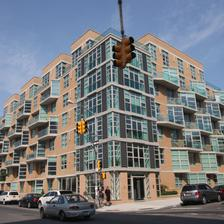

None
Caption:
Stellar invested $8 million to finish the building and quickly rented out the units, some for as high as $70 a square foot, said Mathew Lembo, a vice president at Stellar.
True val

American Realty Advisors paid more than $895,000 for each of the 62 apartments in 111 Kent Avenue in Williamsburg, Brooklyn.





['American', 'Realty', 'Advisors', 'paid', 'more', 'than', '$895,000', 'for', 'each', 'of', 'the', '62', 'apartments', 'in', '111', 'Kent', 'Avenue', 'in', 'Williamsburg,', 'Brooklyn.']
['Stellar', 'invested', '$8', 'million', 'to', 'finish', 'the', 'building', 'and', 'quickly', 'rented', 'out', 'the', 'units,', 'some', 'for', 'as', 'high', 'as', '$70', 'a', 'square', 'foot,', 'said', 'Mathew', 'Lembo,', 'a', 'vice', 'president', 'at', 'Stellar.']
0.5039843787265444
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


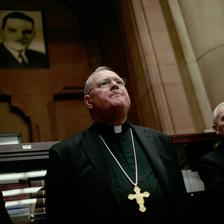

None
Caption:
The process, known as "laicization," is a formal church juridical procedure that requires Vatican approval, and can take far longer if the priest objects.
True val

Cardinal Timothy M. Dolan





['Cardinal', 'Timothy', 'M.', 'Dolan']
['The', 'process,', 'known', 'as', '"laicization,"', 'is', 'a', 'formal', 'church', 'juridical', 'procedure', 'that', 'requires', 'Vatican', 'approval,', 'and', 'can', 'take', 'far', 'longer', 'if', 'the', 'priest', 'objects.']
0.4518010018049224
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


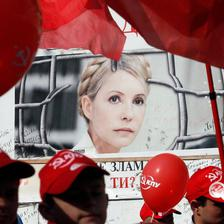

None
Caption:
It will be hosted in conjunction with Poland, a European Union member, and was meant to spotlight Europe's push for greater inclusiveness in its former Soviet backyard.
True val

A poster of the jailed opposition leader Yulia V. Tymoshenko amid a May Day rally in Kiev.





['A', 'poster', 'of', 'the', 'jailed', 'opposition', 'leader', 'Yulia', 'V.', 'Tymoshenko', 'amid', 'a', 'May', 'Day', 'rally', 'in', 'Kiev.']
['It', 'will', 'be', 'hosted', 'in', 'conjunction', 'with', 'Poland,', 'a', 'European', 'Union', 'member,', 'and', 'was', 'meant', 'to', 'spotlight', "Europe's", 'push', 'for', 'greater', 'inclusiveness', 'in', 'its', 'former', 'Soviet', 'backyard.']
0.4386913376508308
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


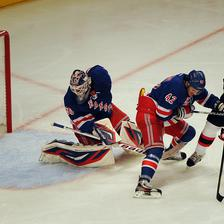

None
Caption:
First, Stephen Gionta scored on a rebound less than three minutes in; moments later Lundqvist made a save only to watch the puck bounce off center Artem Anisimov's skate and slide back into his net.
True val

Patrik Elias (26) scored the second of the Devils’ three goals in the first period against Rangers goaltender Henrik Lundqvist, who had 12 saves on 16 shots Wednesday at the Garden.





['Patrik', 'Elias', '(26)', 'scored', 'the', 'second', 'of', 'the', 'Devils’', 'three', 'goals', 'in', 'the', 'first', 'period', 'against', 'Rangers', 'goaltender', 'Henrik', 'Lundqvist,', 'who', 'had', '12', 'saves', 'on', '16', 'shots', 'Wednesday', 'at', 'the', 'Garden.']
['First,', 'Stephen', 'Gionta', 'scored', 'on', 'a', 'rebound', 'less', 'than', 'three', 'minutes', 'in;', 'moments', 'later', 'Lundqvist', 'made', 'a', 'save', 'only', 'to', 'watch', 'the', 'puck', 'bounce', 'off', 'center', 'Artem', "Anisimov's", 'skate', 'and', 'slide', 'back', 'into', 'his', 'net.']
0.4889230

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


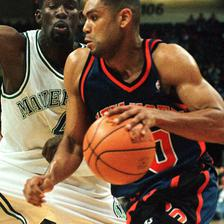

None
Caption:
Asked if he thought a Philadelphia win would classify as an upset, Van Gundy, now an analyst for ESPN, said: "Yes, I think it would be.
True val

Allan Houston helped the Knicks reach the N.B.A. Finals. during the 1998-99 season.





['Allan', 'Houston', 'helped', 'the', 'Knicks', 'reach', 'the', 'N.B.A.', 'Finals.', 'during', 'the', '1998-99', 'season.']
['Asked', 'if', 'he', 'thought', 'a', 'Philadelphia', 'win', 'would', 'classify', 'as', 'an', 'upset,', 'Van', 'Gundy,', 'now', 'an', 'analyst', 'for', 'ESPN,', 'said:', '"Yes,', 'I', 'think', 'it', 'would', 'be.']
0.4428500142691474
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


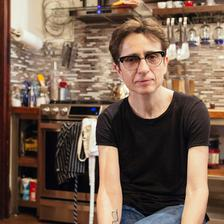

None
Caption:
I went online in search of a picture of my mother -- it was an anniversary of her death, and I was on the road somewhere, and I wanted a picture.
True val
Masha Gessen



['Masha', 'Gessen']
['I', 'went', 'online', 'in', 'search', 'of', 'a', 'picture', 'of', 'my', 'mother', '--', 'it', 'was', 'an', 'anniversary', 'of', 'her', 'death,', 'and', 'I', 'was', 'on', 'the', 'road', 'somewhere,', 'and', 'I', 'wanted', 'a', 'picture.']
0.5039843787265444


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


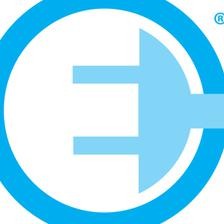

None
Caption:
Of equal urgency, there is no broad agreement to define the signs that warn drivers of vehicles powered by internal combustion engines not to park in designated charging spaces -- a nuisance that E.V.
True val

POWER UP Portland General Electric specifies how its charging station logos can be displayed.





['POWER', 'UP', 'Portland', 'General', 'Electric', 'specifies', 'how', 'its', 'charging', 'station', 'logos', 'can', 'be', 'displayed.']
['Of', 'equal', 'urgency,', 'there', 'is', 'no', 'broad', 'agreement', 'to', 'define', 'the', 'signs', 'that', 'warn', 'drivers', 'of', 'vehicles', 'powered', 'by', 'internal', 'combustion', 'engines', 'not', 'to', 'park', 'in', 'designated', 'charging', 'spaces', '--', 'a', 'nuisance', 'that', 'E.V.']
0.41412387656655203
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


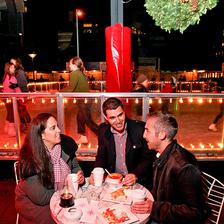

None
Caption:
IN THE SEATS Joshua Crouthamel, 31, an American freelance travel writer based in Sydney, Australia, and his partner, Kurt Fulepp, 27, an Aussie who does marketing for Bing, the Internet search engine, were on a weekend jaunt to experience "New York Christmas kitsch."
True val

WITH ICE Melissa Maguire, Kurt Fulepp, center, and Joshua Crouthamel at the rinkside cafe at the Standard Hotel.





['WITH', 'ICE', 'Melissa', 'Maguire,', 'Kurt', 'Fulepp,', 'center,', 'and', 'Joshua', 'Crouthamel', 'at', 'the', 'rinkside', 'cafe', 'at', 'the', 'Standard', 'Hotel.']
['IN', 'THE', 'SEATS', 'Joshua', 'Crouthamel,', '31,', 'an', 'American', 'freelance', 'travel', 'writer', 'based', 'in', 'Sydney,', 'Australia,', 'and', 'his', 'partner,', 'Kurt', 'Fulepp,', '27,', 'an', 'Aussie', 'who', 'does', 'marketing', 'for', 'Bing,', 'the', 'Internet', 'search', 'engine,', 'were', 'on', 'a', 'weekend', 'jaunt', 'to', 'experience', '"New', 'York', 'Christmas', 'kitsch."']
0.3905106532895161
0.25


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


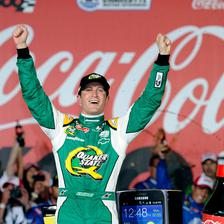

None
Caption:
It was the quickest 600 in history, wrapping up in 3 hours 51 minutes with no multicar pileups along the way.
True val

Kasey Kahne powered to victory in the Coca-Cola 600 on Sunday night, winning NASCAR's longest race for the third time for his first win with Hendrick Motorsports.





['Kasey', 'Kahne', 'powered', 'to', 'victory', 'in', 'the', 'Coca-Cola', '600', 'on', 'Sunday', 'night,', 'winning', "NASCAR's", 'longest', 'race', 'for', 'the', 'third', 'time', 'for', 'his', 'first', 'win', 'with', 'Hendrick', 'Motorsports.']
['It', 'was', 'the', 'quickest', '600', 'in', 'history,', 'wrapping', 'up', 'in', '3', 'hours', '51', 'minutes', 'with', 'no', 'multicar', 'pileups', 'along', 'the', 'way.']
0
0.5


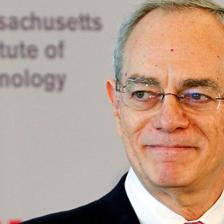

None
Caption:
He is known for his research on semiconductors.
True val

L. Rafael Reif, provost of Massachusetts Institute of Technology for the last seven years, has been chosen as the institution's next president.





['L.', 'Rafael', 'Reif,', 'provost', 'of', 'Massachusetts', 'Institute', 'of', 'Technology', 'for', 'the', 'last', 'seven', 'years,', 'has', 'been', 'chosen', 'as', 'the', "institution's", 'next', 'president.']
['He', 'is', 'known', 'for', 'his', 'research', 'on', 'semiconductors.']
0


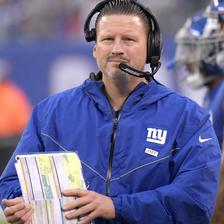

None
Caption:
"Our performance this year, particularly the past two weeks, is inexcusable and frustrating.
True val
Coach Ben McAdoo of the Giants during a 51-17 loss to the Los Angeles Rams on Nov. 5.



['Coach', 'Ben', 'McAdoo', 'of', 'the', 'Giants', 'during', 'a', '51-17', 'loss', 'to', 'the', 'Los', 'Angeles', 'Rams', 'on', 'Nov.', '5.']
['"Our', 'performance', 'this', 'year,', 'particularly', 'the', 'past', 'two', 'weeks,', 'is', 'inexcusable', 'and', 'frustrating.']
0


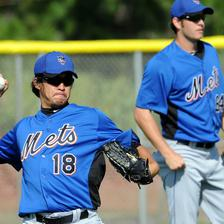

None
Caption:
Because Takahashi had pitched for the Yomiuri Giants, he generated a great deal of interest in Japan, and a handful of Japanese reporters covered the Mets every day last year.
True val

The Japanese pitcher Ryota Igarashi, left, signed a two-year deal last year, but has not pitched much this spring training.





['The', 'Japanese', 'pitcher', 'Ryota', 'Igarashi,', 'left,', 'signed', 'a', 'two-year', 'deal', 'last', 'year,', 'but', 'has', 'not', 'pitched', 'much', 'this', 'spring', 'training.']
['Because', 'Takahashi', 'had', 'pitched', 'for', 'the', 'Yomiuri', 'Giants,', 'he', 'generated', 'a', 'great', 'deal', 'of', 'interest', 'in', 'Japan,', 'and', 'a', 'handful', 'of', 'Japanese', 'reporters', 'covered', 'the', 'Mets', 'every', 'day', 'last', 'year.']
0.5081327481546147
0.4


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


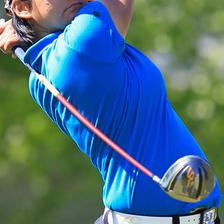

None
Caption:
16 and 17 before winning the first playoff hole when Choi bogeyed.
True val

Yani Tseng of Taiwan lost on Saturday in the Sybase championship in Gladstone, N.J.





['Yani', 'Tseng', 'of', 'Taiwan', 'lost', 'on', 'Saturday', 'in', 'the', 'Sybase', 'championship', 'in', 'Gladstone,', 'N.J.']
['16', 'and', '17', 'before', 'winning', 'the', 'first', 'playoff', 'hole', 'when', 'Choi', 'bogeyed.']
0
0.0


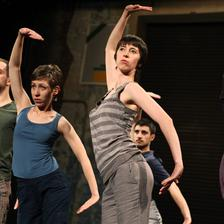

None
Caption:
Bouncing breasts and genitals.
True val

City  From left, Csaba Molnar, Timea Sebestyen, Viktoria Danyi, Moreno Solinas (background) and Igor Urzelai of Bloom! Dance Collective performing in their American debut at the Abrons Arts Center.





['City', 'From', 'left,', 'Csaba', 'Molnar,', 'Timea', 'Sebestyen,', 'Viktoria', 'Danyi,', 'Moreno', 'Solinas', '(background)', 'and', 'Igor', 'Urzelai', 'of', 'Bloom!', 'Dance', 'Collective', 'performing', 'in', 'their', 'American', 'debut', 'at', 'the', 'Abrons', 'Arts', 'Center.']
['Bouncing', 'breasts', 'and', 'genitals.']
0


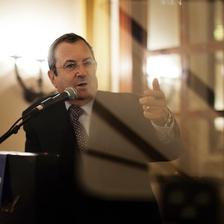

None
Caption:
The tough talk makes Mr. Netanyahu and Mr. Barak seem increasingly isolated in the international arena, where predictions of war in the near future have all but disappeared amid a focus on the negotiations scheduled to continue in Baghdad this month.
True val

“Israel cannot afford to be duped,” Defense Minister Ehud Barak said Monday while discussing international tensions involving Iran’s nuclear program.





['“Israel', 'cannot', 'afford', 'to', 'be', 'duped,”', 'Defense', 'Minister', 'Ehud', 'Barak', 'said', 'Monday', 'while', 'discussing', 'international', 'tensions', 'involving', 'Iran’s', 'nuclear', 'program.']
['The', 'tough', 'talk', 'makes', 'Mr.', 'Netanyahu', 'and', 'Mr.', 'Barak', 'seem', 'increasingly', 'isolated', 'in', 'the', 'international', 'arena,', 'where', 'predictions', 'of', 'war', 'in', 'the', 'near', 'future', 'have', 'all', 'but', 'disappeared', 'amid', 'a', 'focus', 'on', 'the', 'negotiations', 'scheduled', 'to', 'continue', 'in', 'Baghdad', 't

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


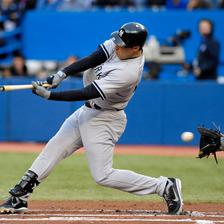

None
Caption:
Omar Vizquel dived to take a base hit from Robinson Cano in the eighth; first baseman Edwin Encarnacion gobbled up Raul Ibanez's sharp grounder two batters later; and Bautista dived to snare a hit by Jeter in the fifth, preventing a single from turning into at triple, at least.
True val

Mark Teixeira striking out against the Blue Jays’ Drew Hutchison in the first inning in Toronto.





['Mark', 'Teixeira', 'striking', 'out', 'against', 'the', 'Blue', 'Jays’', 'Drew', 'Hutchison', 'in', 'the', 'first', 'inning', 'in', 'Toronto.']
['Omar', 'Vizquel', 'dived', 'to', 'take', 'a', 'base', 'hit', 'from', 'Robinson', 'Cano', 'in', 'the', 'eighth;', 'first', 'baseman', 'Edwin', 'Encarnacion', 'gobbled', 'up', 'Raul', "Ibanez's", 'sharp', 'grounder', 'two', 'batters', 'later;', 'and', 'Bautista', 'dived', 'to', 'snare', 'a', 'hit', 'by', 'Jeter', 'in', 'the', 'fifth,', 'preventing', 'a', 'single', 'from', 'turning', 'into', 'at', 'triple,', 'at', 'least.']
0.4494780405208269
0.1

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


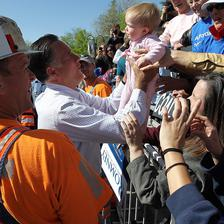

None
Caption:
Rick Perry of Texas, whose formidable network of donors had been a source of concern to Mr. Romney's team during the primary season.
True val

Mitt Romney greeted supporters, including one considerably shy of voting age, at a campaign rally Tuesday in Craig, Colo.





['Mitt', 'Romney', 'greeted', 'supporters,', 'including', 'one', 'considerably', 'shy', 'of', 'voting', 'age,', 'at', 'a', 'campaign', 'rally', 'Tuesday', 'in', 'Craig,', 'Colo.']
['Rick', 'Perry', 'of', 'Texas,', 'whose', 'formidable', 'network', 'of', 'donors', 'had', 'been', 'a', 'source', 'of', 'concern', 'to', 'Mr.', "Romney's", 'team', 'during', 'the', 'primary', 'season.']
0.4566337854967312
0.3333333333333333


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


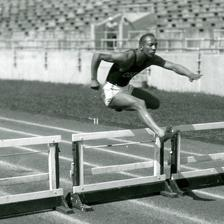

None
Caption:
"Jesse Owens," directed by Laurens Grant and written by the frequent PBS collaborator Stanley Nelson ("Freedom Riders"), is a smooth and handsome production that suffers from its brevity: about 52 minutes, after credits and promos.
True val

Jesse Owens  The track star, shown practicing hurdles in 1935, is examined in this documentary being shown on Tuesday night on PBS stations (check local listings).





['Jesse', 'Owens', 'The', 'track', 'star,', 'shown', 'practicing', 'hurdles', 'in', '1935,', 'is', 'examined', 'in', 'this', 'documentary', 'being', 'shown', 'on', 'Tuesday', 'night', 'on', 'PBS', 'stations', '(check', 'local', 'listings).']
['"Jesse', 'Owens,"', 'directed', 'by', 'Laurens', 'Grant', 'and', 'written', 'by', 'the', 'frequent', 'PBS', 'collaborator', 'Stanley', 'Nelson', '("Freedom', 'Riders"),', 'is', 'a', 'smooth', 'and', 'handsome', 'production', 'that', 'suffers', 'from', 'its', 'brevity:', 'about', '52', 'minutes,', 'after', 'credits', 'and', 'promo

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


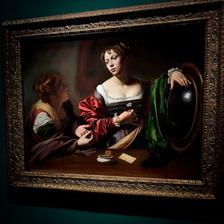

None
Caption:
Ezra Pound was a pro-fascist and pro-Nazi anti-Semite.
True val
Caravaggio was a murderer but also a creator of beauty, including the painting “Marta e Maria Maddalena.”



['Caravaggio', 'was', 'a', 'murderer', 'but', 'also', 'a', 'creator', 'of', 'beauty,', 'including', 'the', 'painting', '“Marta', 'e', 'Maria', 'Maddalena.”']
['Ezra', 'Pound', 'was', 'a', 'pro-fascist', 'and', 'pro-Nazi', 'anti-Semite.']
0.5946035575013605
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


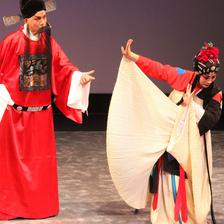

None
Caption:
This is the company that was to have presented Chen Shi-Zheng's 19-hour production of "The Peony Pavilion," the Chinese opera written by Tang Xianzu in 1598, at the Lincoln Center Festival in 1998, but Shanghai municipal authorities blocked the troupe's departure for political reasons.
True val

The Lanke Mountain , an ancient tale, with Yuan Guo Liang, left, and Chen Li, of the Shanghai Kunqu Opera Troupe, at Asia Society.





['The', 'Lanke', 'Mountain', ',', 'an', 'ancient', 'tale,', 'with', 'Yuan', 'Guo', 'Liang,', 'left,', 'and', 'Chen', 'Li,', 'of', 'the', 'Shanghai', 'Kunqu', 'Opera', 'Troupe,', 'at', 'Asia', 'Society.']
['This', 'is', 'the', 'company', 'that', 'was', 'to', 'have', 'presented', 'Chen', "Shi-Zheng's", '19-hour', 'production', 'of', '"The', 'Peony', 'Pavilion,"', 'the', 'Chinese', 'opera', 'written', 'by', 'Tang', 'Xianzu', 'in', '1598,', 'at', 'the', 'Lincoln', 'Center', 'Festival', 'in', '1998,', 'but', 'Shanghai', 'municipal', 'authorities', 'blo

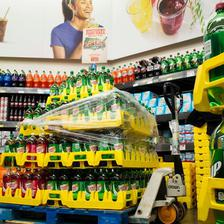

None
Caption:
The study, published in the journal Obesity, relied on a representative sample of 18,000 children 2 to 19 years old, and 27,652 adults aged 20 and older.
True val
Soda pop at a store in New Jersey. Sugary drink consumption has declined in the United States, according to a new study.



['Soda', 'pop', 'at', 'a', 'store', 'in', 'New', 'Jersey.', 'Sugary', 'drink', 'consumption', 'has', 'declined', 'in', 'the', 'United', 'States,', 'according', 'to', 'a', 'new', 'study.']
['The', 'study,', 'published', 'in', 'the', 'journal', 'Obesity,', 'relied', 'on', 'a', 'representative', 'sample', 'of', '18,000', 'children', '2', 'to', '19', 'years', 'old,', 'and', '27,652', 'adults', 'aged', '20', 'and', 'older.']
0.4386913376508308
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


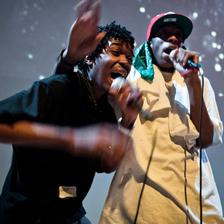

None
Caption:
-- on Friday evening in the basement lecture hall of the New Museum.
True val

MondreM.A.N., left, and Squadda B of Main Attrakionz, a young hip-hop duo from Oakland, Calif., at a performance on Friday.





['MondreM.A.N.,', 'left,', 'and', 'Squadda', 'B', 'of', 'Main', 'Attrakionz,', 'a', 'young', 'hip-hop', 'duo', 'from', 'Oakland,', 'Calif.,', 'at', 'a', 'performance', 'on', 'Friday.']
['--', 'on', 'Friday', 'evening', 'in', 'the', 'basement', 'lecture', 'hall', 'of', 'the', 'New', 'Museum.']
0
0.0


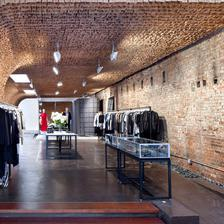

None
Caption:
With its preppy air, C. WONDER is a natural fit for Southampton, N.Y. As of this weekend, an outpost of the boutique, open until Labor Day, will cater to denizens of the seashore, offering summer essentials like nautical-themed coasters ($10 for a set of 12), fully stocked wicker picnic baskets ($128), cotton dresses in sailor stripes ($58) and canvas espadrilles ($28).
True val

The ceiling and one wall inside Owen, a new boutique in the meatpacking district, are covered with 25,000 brown paper bags.





['The', 'ceiling', 'and', 'one', 'wall', 'inside', 'Owen,', 'a', 'new', 'boutique', 'in', 'the', 'meatpacking', 'district,', 'are', 'covered', 'with', '25,000', 'brown', 'paper', 'bags.']
['With', 'its', 'preppy', 'air,', 'C.', 'WONDER', 'is', 'a', 'natural', 'fit', 'for', 'Southampton,', 'N.Y.', 'As', 'of', 'this', 'weekend,', 'an', 'outpost', 'of', 'the', 'boutique,', 'open', 'until', 'Labor', 'Day,', 'will', 'cater', 'to', 'denizens', 'of', 'the', 'seashore,', 'offer

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


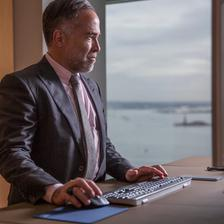

None
Caption:
"At the same time, I think it's important, while asking those questions, to recognize that the rules, broadly speaking, are working.
True val
Marty Chavez, the chief financial officer of Goldman Sachs, says, “I’m not paid or evaluated on the accuracy of my crystal-ball predictions. I’m paid to enumerate every possible outcome and do something about every possible outcome well in advance, when it’s still possible to do something, because once it’s happened it’s too late.”



['Marty', 'Chavez,', 'the', 'chief', 'financial', 'officer', 'of', 'Goldman', 'Sachs,', 'says,', '“I’m', 'not', 'paid', 'or', 'evaluated', 'on', 'the', 'accuracy', 'of', 'my', 'crystal-ball', 'predictions.', 'I’m', 'paid', 'to', 'enumerate', 'every', 'possible', 'outcome', 'and', 'do', 'something', 'about', 'every', 'possible', 'outcome', 'well', 'in', 'advance,', 'when', 'it’s', 'still', 'possible', 'to', 'do', 'something,', 'because', 'once', 'it’s', 'happened', 'it’s', 'too', 'late.”']
['"At', 'the'

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


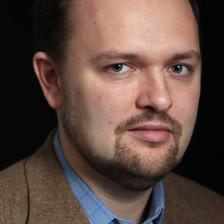

None
Caption:
That isn't a serious approach to academic diversity, and in an emerging majority-minority America (already visible in the latest Census birth statistics) where almost everyone will be 1/8 something-or-other, it will be an increasingly untenable one as well.
True val

Ross Douthat





['Ross', 'Douthat']
['That', "isn't", 'a', 'serious', 'approach', 'to', 'academic', 'diversity,', 'and', 'in', 'an', 'emerging', 'majority-minority', 'America', '(already', 'visible', 'in', 'the', 'latest', 'Census', 'birth', 'statistics)', 'where', 'almost', 'everyone', 'will', 'be', '1/8', 'something-or-other,', 'it', 'will', 'be', 'an', 'increasingly', 'untenable', 'one', 'as', 'well.']
0.40276720463657734
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


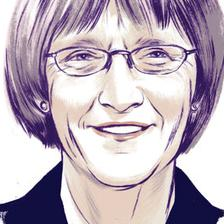

None
Caption:
It remains the best explanation of how the American research university emerged and evolved, and why its commitment to the critical perspective and the long view is so important to our present and future.
True val

Drew Gilpin Faust





['Drew', 'Gilpin', 'Faust']
['It', 'remains', 'the', 'best', 'explanation', 'of', 'how', 'the', 'American', 'research', 'university', 'emerged', 'and', 'evolved,', 'and', 'why', 'its', 'commitment', 'to', 'the', 'critical', 'perspective', 'and', 'the', 'long', 'view', 'is', 'so', 'important', 'to', 'our', 'present', 'and', 'future.']
0
0.0


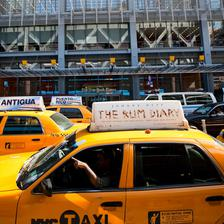

None
Caption:
A trip to , which is currently $45, could reach $54, not counting the cost of tolls.
True val

New York City taxi fares may soon be on the rise, by as much as 20 percent.





['New', 'York', 'City', 'taxi', 'fares', 'may', 'soon', 'be', 'on', 'the', 'rise,', 'by', 'as', 'much', 'as', '20', 'percent.']
['A', 'trip', 'to', ',', 'which', 'is', 'currently', '$45,', 'could', 'reach', '$54,', 'not', 'counting', 'the', 'cost', 'of', 'tolls.']
0.4924790605054523
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


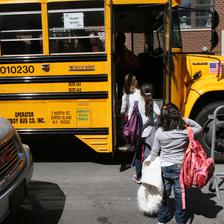

None
Caption:
Because schools did not close on any of the days set aside for snow and other emergencies, the Department of Education is granting schools permission to cancel classes on the last Monday and Tuesday of June.
True val

Students at Public School 84 in Manhattan. Because there were no snow days, the school may cancel classes on June 25 and 26.





['Students', 'at', 'Public', 'School', '84', 'in', 'Manhattan.', 'Because', 'there', 'were', 'no', 'snow', 'days,', 'the', 'school', 'may', 'cancel', 'classes', 'on', 'June', '25', 'and', '26.']
['Because', 'schools', 'did', 'not', 'close', 'on', 'any', 'of', 'the', 'days', 'set', 'aside', 'for', 'snow', 'and', 'other', 'emergencies,', 'the', 'Department', 'of', 'Education', 'is', 'granting', 'schools', 'permission', 'to', 'cancel', 'classes', 'on', 'the', 'last', 'Monday', 'and', 'Tuesday', 'of', 'June.']
0
0.0


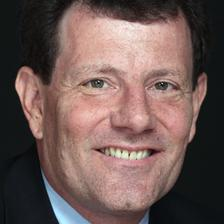

None
Caption:
Such a deal was negotiated and then ultimately collapsed, but at least one town does sell advertising on its police cars.
True val

Nicholas Kristof





['Nicholas', 'Kristof']
['Such', 'a', 'deal', 'was', 'negotiated', 'and', 'then', 'ultimately', 'collapsed,', 'but', 'at', 'least', 'one', 'town', 'does', 'sell', 'advertising', 'on', 'its', 'police', 'cars.']
0.4671379777282001
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


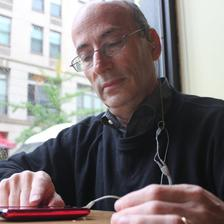

None
Caption:
It attaches to the TV audio output and can either run around the edges of the room or just be placed inside a mat that sits beneath a chair, or in a pad that tucks under a cushion.
True val

In a noisy restaurant, earphones and an iPhone app that amplifies and processes sound help Richard Einhorn, a composer, converse with friends.





['In', 'a', 'noisy', 'restaurant,', 'earphones', 'and', 'an', 'iPhone', 'app', 'that', 'amplifies', 'and', 'processes', 'sound', 'help', 'Richard', 'Einhorn,', 'a', 'composer,', 'converse', 'with', 'friends.']
['It', 'attaches', 'to', 'the', 'TV', 'audio', 'output', 'and', 'can', 'either', 'run', 'around', 'the', 'edges', 'of', 'the', 'room', 'or', 'just', 'be', 'placed', 'inside', 'a', 'mat', 'that', 'sits', 'beneath', 'a', 'chair,', 'or', 'in', 'a', 'pad', 'that', 'tucks', 'under', 'a', 'cushion.']
0.47897362544357464


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


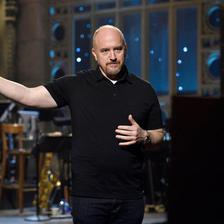

None
Caption:
1 cause of injury and mayhem to women" and pointed out that for women, spending time alone with a man requires "courage."
True val
Louis C.K. on “Saturday Night Live” in April.



['Louis', 'C.K.', 'on', '“Saturday', 'Night', 'Live”', 'in', 'April.']
['1', 'cause', 'of', 'injury', 'and', 'mayhem', 'to', 'women"', 'and', 'pointed', 'out', 'that', 'for', 'women,', 'spending', 'time', 'alone', 'with', 'a', 'man', 'requires', '"courage."']
0.46173663094410267
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


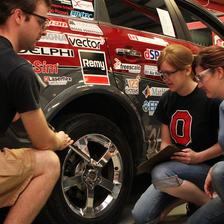

None
Caption:
While established automakers and parts suppliers remain favored destinations, a growing number of students are forgoing a bigger paycheck and more job security and going to work for start-ups and smaller companies, or in developing countries, where they can have greater influence, according to Margaret Wooldridge, director of the Automotive Engineering Program at the University of Michigan.
True val

TEAM SPIRIT From left, Ohio State’s EcoCAR 2 team members Travis Trippel, Katherine Bovee and Amanda Hyde with the Saturn Vue that finished second in an earlier competition.





['TEAM', 'SPIRIT', 'From', 'left,', 'Ohio', 'State’s', 'EcoCAR', '2', 'team', 'members', 'Travis', 'Trippel,', 'Katherine', 'Bovee', 'and', 'Amanda', 'Hyde', 'with', 'the', 'Saturn', 'Vue', 'that', 'finished', 'second', 'in', 'an', 'earlier', 'competition.']
['While', 'established', 'automakers', 'and', 'parts', 'suppliers', 'remain', 'favored', 'destinations,', 'a', 'growing', 'number', 'of', 'stude

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


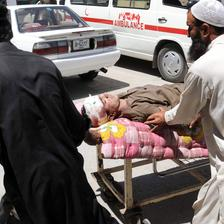

None
Caption:
The Pakistani Taliban took credit for the attack and a spokesman said the two officials had been targeted in retaliation for the death of Sheik Marwan, a Qaeda commander killed by security forces in Bajaur last year.
True val

Rescue workers transported an injured man after a bomb blast in Peshawar on Friday.





['Rescue', 'workers', 'transported', 'an', 'injured', 'man', 'after', 'a', 'bomb', 'blast', 'in', 'Peshawar', 'on', 'Friday.']
['The', 'Pakistani', 'Taliban', 'took', 'credit', 'for', 'the', 'attack', 'and', 'a', 'spokesman', 'said', 'the', 'two', 'officials', 'had', 'been', 'targeted', 'in', 'retaliation', 'for', 'the', 'death', 'of', 'Sheik', 'Marwan,', 'a', 'Qaeda', 'commander', 'killed', 'by', 'security', 'forces', 'in', 'Bajaur', 'last', 'year.']
0.48217764100758403
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


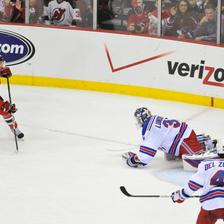

None
Caption:
NEWARK -- Michael Del Zotto was not celebrating just after the Rangers' victory in Game 3 of the Eastern Conference finals on Saturday.
True val

Defenseman Michael Del Zotto was caught drastically out of position on this Devils rush. As a result, Travis Zajac beat Henrik Lundqvist for a first-period goal that put the Devils in front, 2-0.





['Defenseman', 'Michael', 'Del', 'Zotto', 'was', 'caught', 'drastically', 'out', 'of', 'position', 'on', 'this', 'Devils', 'rush.', 'As', 'a', 'result,', 'Travis', 'Zajac', 'beat', 'Henrik', 'Lundqvist', 'for', 'a', 'first-period', 'goal', 'that', 'put', 'the', 'Devils', 'in', 'front,', '2-0.']
['NEWARK', '--', 'Michael', 'Del', 'Zotto', 'was', 'not', 'celebrating', 'just', 'after', 'the', "Rangers'", 'victory', 'in', 'Game', '3', 'of', 'the', 'Eastern', 'Conference', 'finals', 'on', 'Saturday.']
0
0.3333333333333333


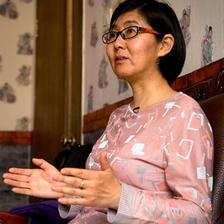

None
Caption:
Mr. Bao had been planning to travel in Japan for two weeks to celebrate having successfully taken a test to study abroad, according to his father, Bao Longjun.
True val
Wang Yu, a prominent Chinese human rights lawyer, in Beijing in 2015. Her son was stopped from traveling to Japan.



['Wang', 'Yu,', 'a', 'prominent', 'Chinese', 'human', 'rights', 'lawyer,', 'in', 'Beijing', 'in', '2015.', 'Her', 'son', 'was', 'stopped', 'from', 'traveling', 'to', 'Japan.']
['Mr.', 'Bao', 'had', 'been', 'planning', 'to', 'travel', 'in', 'Japan', 'for', 'two', 'weeks', 'to', 'celebrate', 'having', 'successfully', 'taken', 'a', 'test', 'to', 'study', 'abroad,', 'according', 'to', 'his', 'father,', 'Bao', 'Longjun.']
0.4347208719449914
0.3333333333333333


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


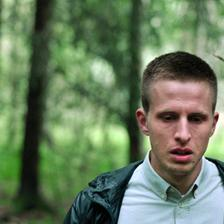

None
Caption:
He makes his way back to the rehab center where he lives, stopping along the way for a suicide attempt that may, for all we know, be a daily ritual of halfhearted self-destruction.
True val

Anders Danielsen Lie in “Oslo, August 31st,” loosely based on “Le Feu Follet,” a 1931 novel by Pierre Drieu La Rochelle.





['Anders', 'Danielsen', 'Lie', 'in', '“Oslo,', 'August', '31st,”', 'loosely', 'based', 'on', '“Le', 'Feu', 'Follet,”', 'a', '1931', 'novel', 'by', 'Pierre', 'Drieu', 'La', 'Rochelle.']
['He', 'makes', 'his', 'way', 'back', 'to', 'the', 'rehab', 'center', 'where', 'he', 'lives,', 'stopping', 'along', 'the', 'way', 'for', 'a', 'suicide', 'attempt', 'that', 'may,', 'for', 'all', 'we', 'know,', 'be', 'a', 'daily', 'ritual', 'of', 'halfhearted', 'self-destruction.']
0.4172261448611506
0.2503531925219512
0.21837510442773592
0.5263157894736842
0.042105263157894736
0.07368421052631578
0.14736842105263157
0.021052631578947368
0.10526315789473684
0.08421052631578947
109


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


In [33]:
sum=0
sum2=0
no=0
no2=0
a0=0
a1=0
a2=0
a3=0
a4=0
a5=0
a7=0
for i in range(1500,1609):
  key=all_data[i]
  context_vec = output[i-1500]
  #print(context_vec.shape)
  m=-2
  cap_final=""
  for j in range(0,len(article_list_real[key])):
    npo = np.array(emd_im_name_article_list_tokenized[key]) 
    B = npo[j]
    cos_sim=cosine_similarity(context_vec.reshape(1,-1),B.reshape(1,-1))
    if cos_sim > m:
      m=cos_sim
      cap_final = article_list_real[key][j]
  img_path='/content/gdrive/MyDrive/Use Image/'+str(key)+'_'+str(img_cap_real[key]) +'.jpg'
  image = cv2.imread(img_path)
  print(cv2_imshow(image))
  print("Caption:")
  print(cap_final)
  print("True val")
  print(caption_real[key])
  print("\n\n")
  re = (caption_real[key])
  ca = (cap_final)
  reference=[]
  candidate=[]
  reference.append(re)
  candidate.append(ca)
  reference=reference[0].split()
  candidate=candidate[0].split()
  print(reference)
  print(candidate) 
  score = sentence_bleu(reference, candidate)
  sum+=score
  no+=1
  print(score)
  text=cap_final
  doc = nlp(text)
  matches=0
  maxlen=0
  for entity in doc.ents:
    if entity.label_!="DATE":
      maxlen=maxlen+1
      if entity.text.lower() in re.lower():
        matches=matches+1
  if maxlen!=0:
    print(matches/maxlen)
    sum2+=matches/maxlen
    no2+=1
    tem=matches/maxlen
    tem=tem*100.0
    if tem>=0 and tem<10:
      a0+=1
    elif tem>=10 and tem<20:
      a1+=1
    elif tem>=20 and tem<30:
      a2+=1
    elif tem>=30 and tem<40:
      a3+=1
    elif tem>=40 and tem<50:
      a4+=1
    elif tem>=50 and tem<70:
      a5+=1
    else:
      a7+=1
    
  

print(sum/no)
print(sum2/no2)
print(a0/no2)
print(a1/no2)
print(a2/no2)
print(a3/no2)
print(a4/no2)
print(a5/no2)
print(a7/no2)
print(no)



